In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import gc
import pickle
import tqdm.autonotebook as tqdm

import sys
import subprocess

%matplotlib inline
import re
import glob
import os
import sys

import scanpy as sc
import scvelo as scv
import cellrank as cr

# import scvi
import numpy as np
import pandas as pd
import pickle as pkl
import scipy
import sklearn

import matplotlib.pyplot as plt
import matplotlib as mpl

import seaborn as sns; sns.set(color_codes=True)

from numpy import cov
from collections import Counter
from collections import defaultdict
from collections.abc import Iterable
from sklearn.linear_model import LogisticRegression
from pathlib import Path
from matplotlib import rcParams

from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances

rcParams['figure.figsize'] = 20,20

scv.settings.verbosity = 3
scv.settings.set_figure_params("scvelo")
cr.settings.verbosity = 2

#import torch
#print('cuda availability : {}'.format(torch.cuda.is_available()))
#print('cuda count : {}'.format(torch.cuda.device_count()))
#print(torch.version.cuda)

#import palantir
import scanpy.external as sce

plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

/tmp/ipykernel_1025062/1278016823.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  import tqdm.autonotebook as tqdm
Global seed set to 0


In [2]:
adata = sc.read_h5ad('/lustre/scratch126/cellgen/team205/aa34/Arian/Dis2P/dis2p_reproducibility/figure_notebooks/antony/latents/NoAge_development_clustering_pretrainAE_0_maxEpochs_1000_reconW_20_cfWeight_0.8_beta_0.003_clf_0.02_adv_0.014_advp_5_n_cf_1_lr_0.003_wd_5e-05_new_cf_True_dropout_0.1_n_hidden_128_n_latent_32_n_layers_2_weighted_classifier_False.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 841966 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chua

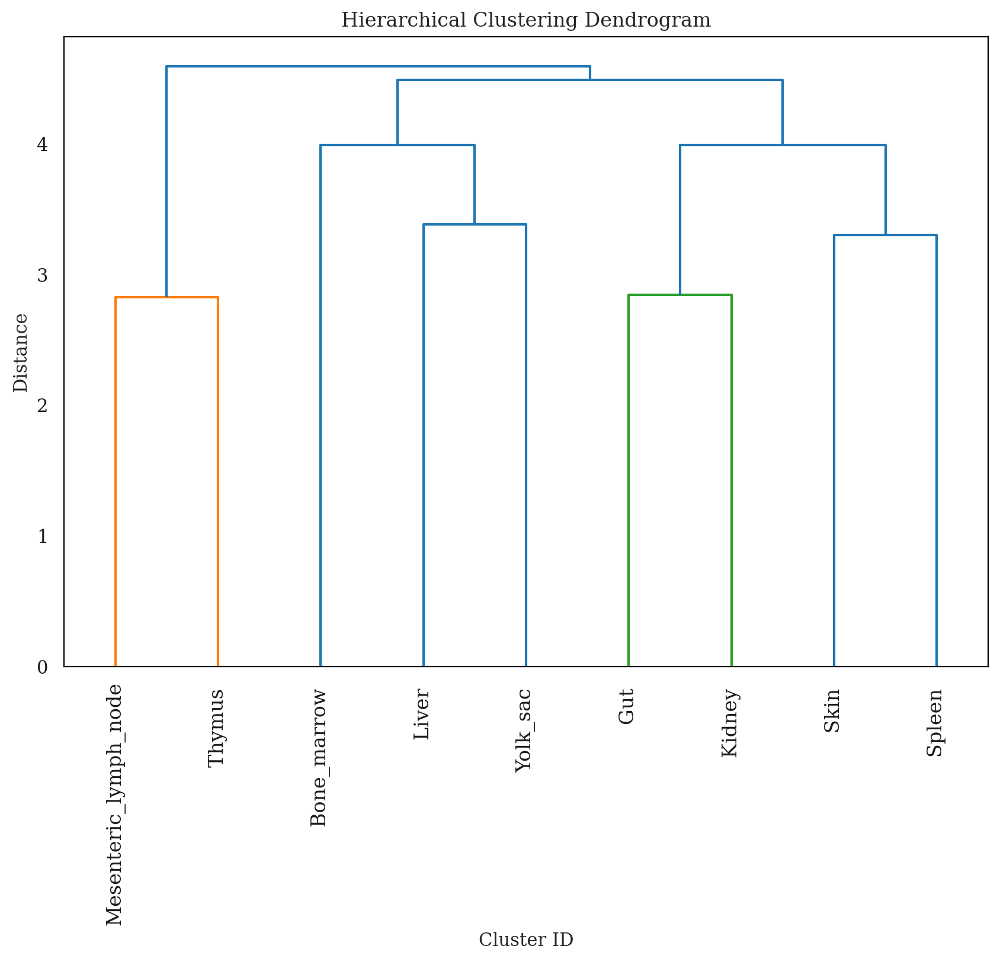

In [4]:
import numpy as np
from sklearn.metrics.pairwise import pairwise_distances
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
from scipy.spatial.distance import squareform

# Assuming your embeddings are stored in `embeddings` (shape: [800000, 128])
# And your cluster annotations are in `cluster_labels` (shape: [800000, ])
embeddings = adata.obsm['dis2p_cE_Z_organ'].copy()
embeddings = embeddings[:, -32:]
cluster_labels = adata.obs['organ'].values


# subsample_size = int(1 * embeddings.shape[0])  # Use 10% of the data, adjust as needed
np.random.seed(1)
# subsample_indices = np.random.choice(embeddings.shape[0], size=subsample_size, replace=False)
# embeddings = embeddings[subsample_indices]
# cluster_labels = cluster_labels[subsample_indices]

# Step 1: Compute the mean of each cluster
unique_clusters = np.unique(cluster_labels)
cluster_centroids = np.array([embeddings[cluster_labels == cluster].mean(axis=0) for cluster in unique_clusters])

# Step 2: Compute pairwise distances between cluster centroids
dist_matrix = pairwise_distances(cluster_centroids, metric='euclidean')
dist_matrix = squareform(dist_matrix)

# Step 3: Perform hierarchical clustering using the linkage method
Z = linkage(dist_matrix, method='ward')

# Step 4: Plot the dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z, labels=unique_clusters.astype(str), leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster ID')
plt.ylabel('Distance')

plt.savefig('suo_figs/dendrogram.png', dpi=150, bbox_inches='tight')
plt.savefig('suo_figs/dendrogram.svg', dpi=150, bbox_inches='tight')

plt.show()
plt.close()

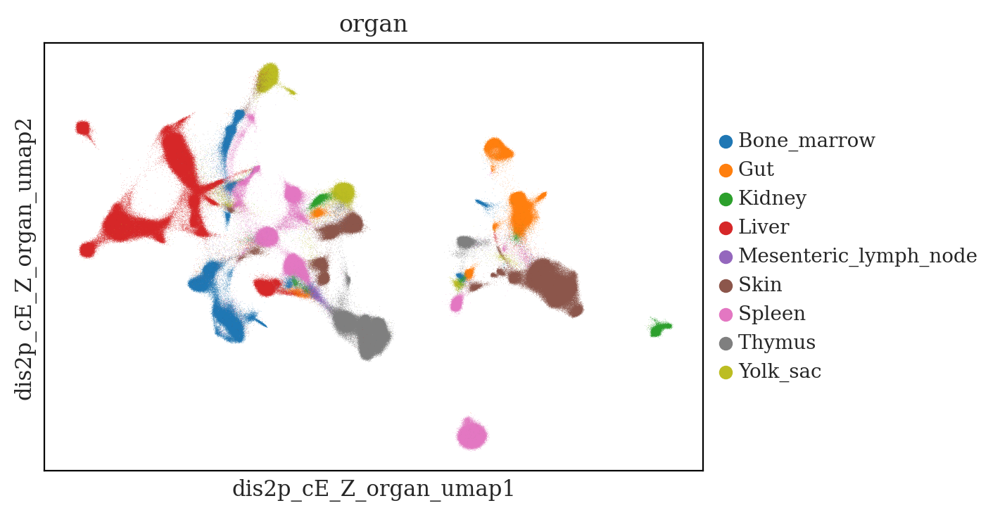

In [5]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.embedding(
    adata, 
    color='organ',
    basis='dis2p_cE_Z_organ_umap',
    title="organ", 
    #legend_loc='on data',  
    legend_fontsize=10,    
    legend_fontoutline=2,
    ax=ax,
    show=False,
)

fig.savefig('suo_figs/organ_umap_all.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/organ_umap_all.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

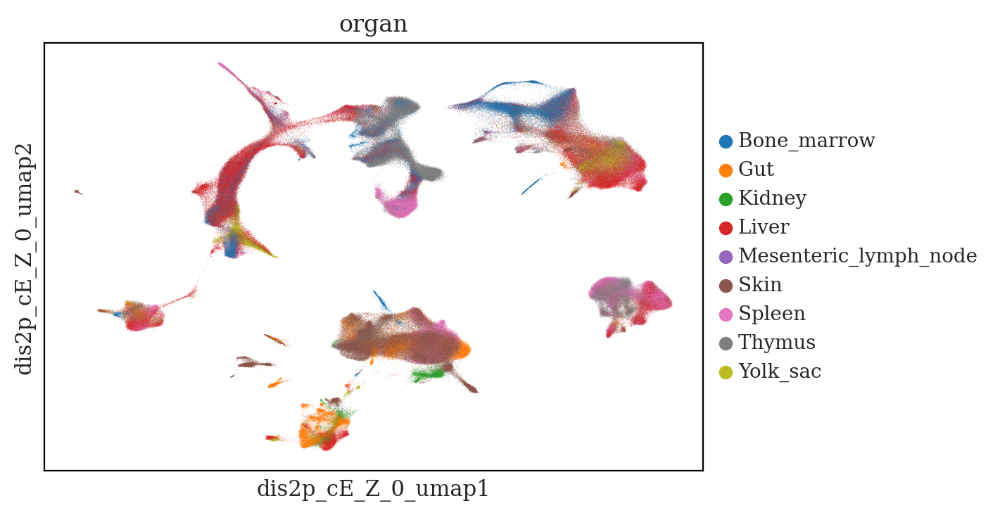

In [6]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.embedding(
    adata, 
    color='organ',
    basis='dis2p_cE_Z_0_umap',
    title="organ", 
    #legend_loc='on data',  
    legend_fontsize=10,    
    legend_fontoutline=2,
    ax=ax,
    show=False,
)

fig.savefig('suo_figs/z0_umap_all.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/z0_umap_all.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

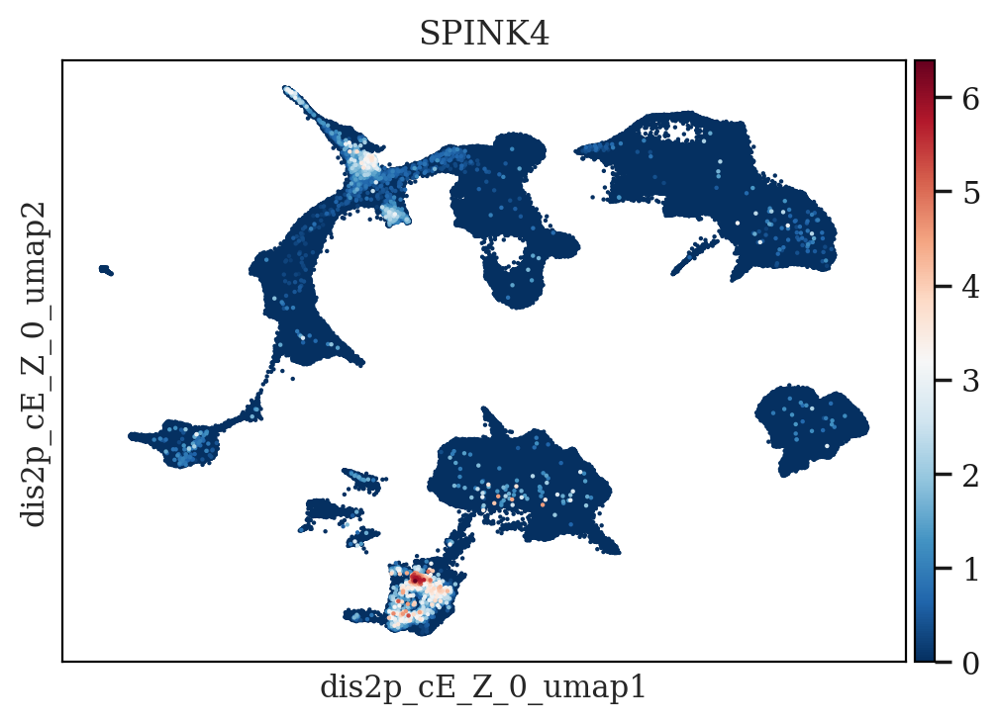

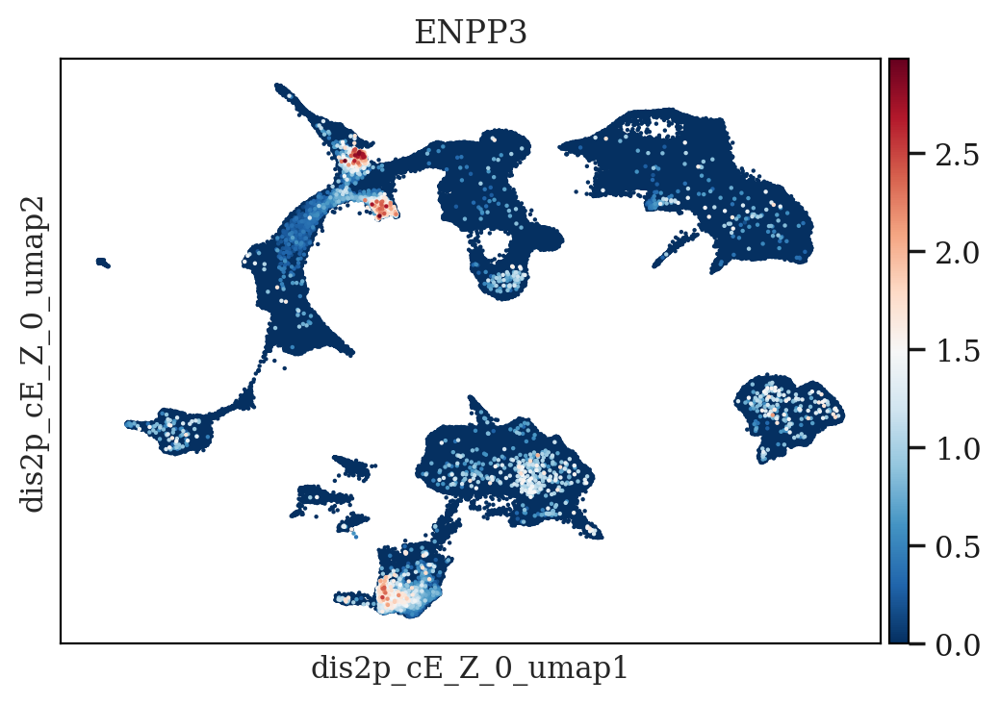

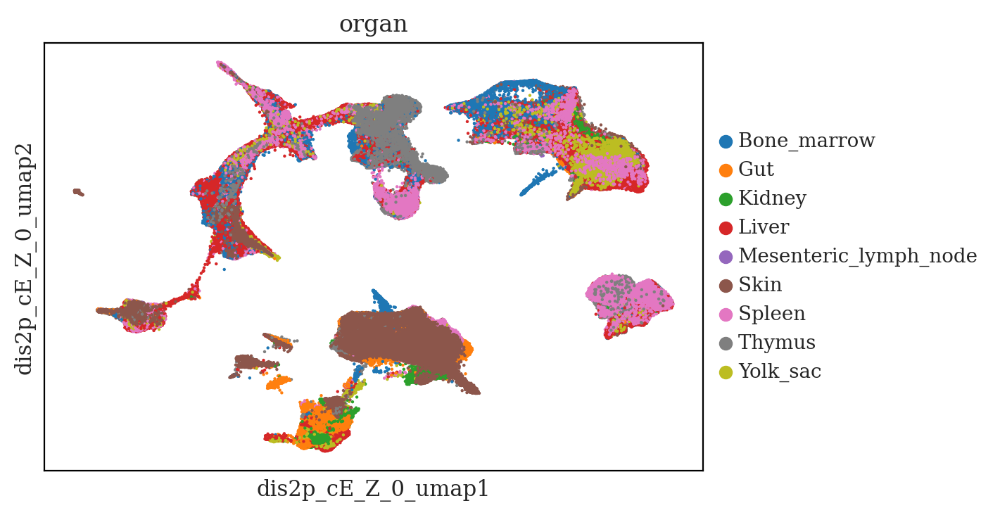

In [7]:
for col in ['SPINK4', 'ENPP3', 'organ']:
    fig, ax = plt.subplots(nrows=1, ncols=1)
    sc.pl.embedding(
        adata, 
        color=col,
        basis='dis2p_cE_Z_0_umap',
        # title="organ", 
        #legend_loc='on data',  
        legend_fontsize=10,    
        legend_fontoutline=2,
        size=10,
        ax=ax,
        show=False,
    )
    fig.savefig(f'suo_figs/z0_{col}_all.svg', dpi=150, bbox_inches='tight')
    fig.savefig(f'suo_figs/z0_{col}_all.png', dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)

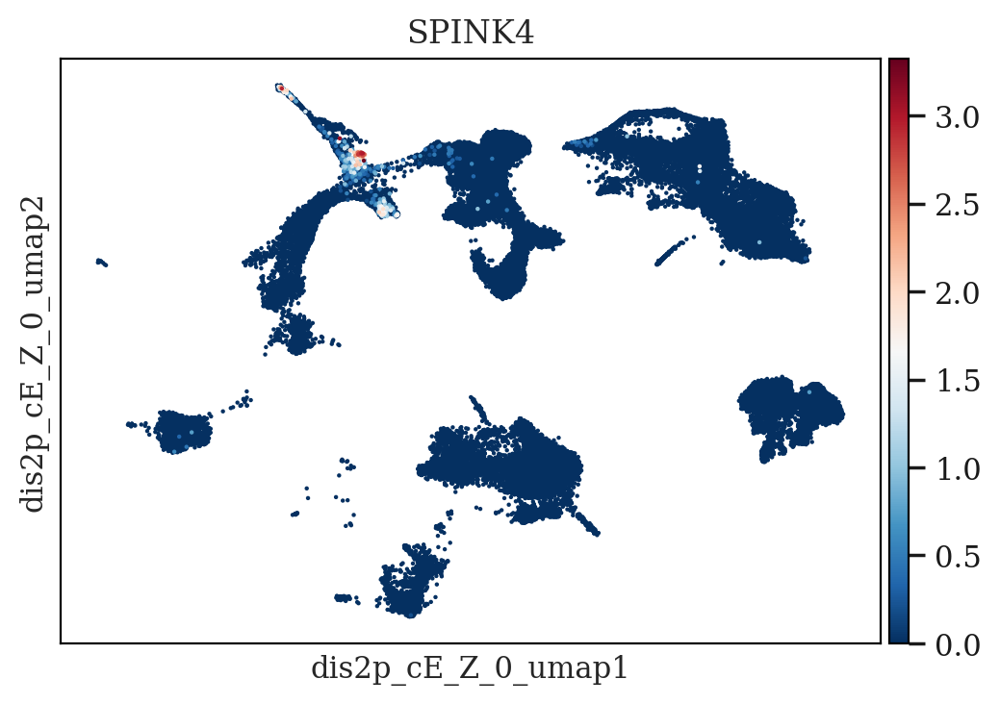

In [8]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.embedding(
    adata[adata.obs['sample_ID'] == 'F45'], 
    color=['SPINK4'],
    # groups=['F67', 'F69', 'F45', 'F38',],
    basis='dis2p_cE_Z_0_umap',
    # title="organ", 
    #legend_loc='on data',  
    legend_fontsize=10,    
    legend_fontoutline=2,
    size=10,
    ax=ax,
    show=False,
)

fig.savefig('suo_figs/SPINK4_sampleID_F45_Z0.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/SPINK4_sampleID_F45_Z0.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [6]:
sub = sc.read_h5ad("scdisecct_on_immune_analysis_paga.h5ad")

In [7]:
sub.obs["new_anno"] = [str(i) for i in sub.obs["orig_anno"]]
sub.obs.loc[sub.obs["leiden_clusters_sub_res1"] == "12", "new_anno"] = "new_cell"

In [8]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

In [9]:
new_cell_names = sub[sub.obs['new_anno'] == 'new_cell'].obs.index
new_cell_names

Index(['FCAImmP7579224-GACGGCTCATGGTTGT', 'FCAImmP7803039-GCTGCTTGTTTGACAC',
       'FCAImmP7198630-TCTTCGGTCCAAGCCG', 'FCAImmP7528279-CATTCGCTCTGCCAGG',
       'FCAImmP7528279-CTGATAGTCACCTCGT', 'FCAImmP7528279-AAAGCAATCAGAGACG',
       'FCAImmP7528279-CTGAAACGTGGTCCGT', 'FCAImmP7528279-CGCGGTACATCGATTG',
       'FCAImmP7555857-ACTGAACAGTGCGTGA', 'FCAImmP7555857-AGTTGGTAGTAGCCGA',
       ...
       'FCAImmP7803020-GGGTCTGGTCAGATAA', 'FCAImmP7803020-CGTTCTGGTAACGTTC',
       'FCAImmP7803020-ACGGCCATCCAGTATG', 'FCAImmP7803020-TTTCCTCCAGATCTGT',
       'FCAImmP7803020-AAAGTAGAGCCCTAAT', 'FCAImmP7803020-TTAGGACAGGGTCGAT',
       'FCAImmP7803020-CGTGTAAAGTACCGGA', 'FCAImmP7803020-GACGGCTAGTCCGTAT',
       'FCAImmP7803020-TACTTGTGTACGACCC', 'FCAImmP7803020-ATGGGAGAGGGTGTTG'],
      dtype='object', length=622)

In [11]:
adata.obs['new_anno'] = adata.obs['orig_anno'].copy()
adata.obs['new_anno'] = adata.obs['new_anno'].astype(str)
adata.obs.loc[adata.obs.index.isin(new_cell_names), 'new_anno'] = 'new_cell'
adata.obs['new_anno'] = adata.obs['new_anno'].astype('category')

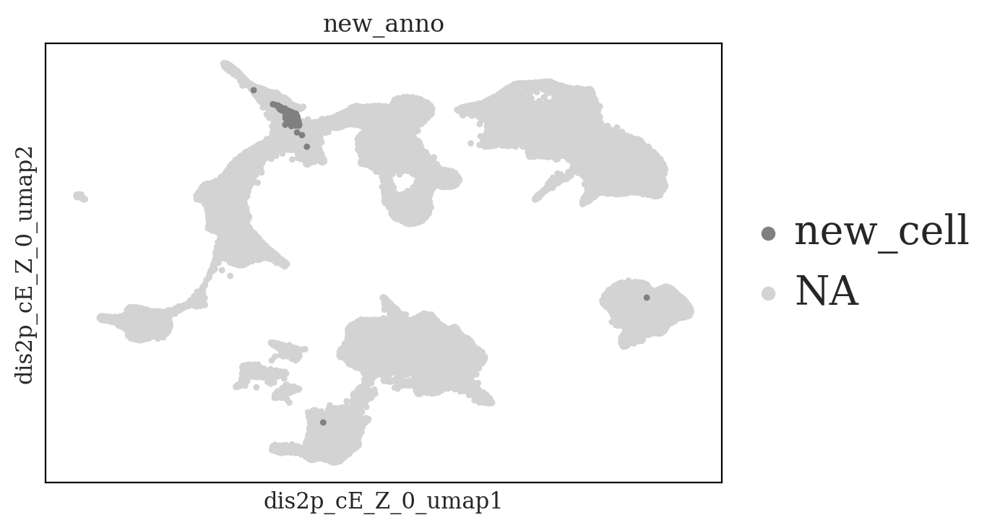

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.embedding(
    adata, 
    color=['new_anno'],
    groups=['new_cell',],
    basis='dis2p_cE_Z_0_umap',
    # title="organ", 
    #legend_loc='on data',  
    legend_fontsize=20,    
    legend_fontoutline=2,
    size=40,
    ax=ax,
    show=False,
)

fig.savefig('suo_figs/new_anno_new_cell_Z0.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/new_anno_new_cell_Z0.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [9]:
sub = adata[adata.obs['orig_anno'].isin(['CMP', 'CYCLING_MEMP', 'CYCLING_MPP', 'EARLY_ERYTHROID', 'EARLY_MK', 'EOSINOPHIL_BASOPHIL', 
                                                   'GMP', 'HSC_MPP', 'LATE_ERYTHROID', 'LATE_MK', 'LMPP_MLP', 'MAST_CELL', 'MEMP', 'MEP', 'MID_ERY', 'MOP'])].copy()


In [10]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

In [11]:
l = 'dis2p_cE_Z_0'

sc.pp.neighbors(sub, n_neighbors=5, use_rep=l, key_added=f'{l}_neighbors', random_state=0)
sc.tl.umap(sub, neighbors_key=f'{l}_neighbors', random_state=0)
sub.obsm[f'X_{l}_umap'] = sub.obsm['X_umap']
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

In [12]:
l = 'dis2p_cE_Z_organ'

sc.pp.neighbors(sub, n_neighbors=5, use_rep=l, key_added=f'{l}_neighbors', random_state=0)
sc.tl.umap(sub, neighbors_key=f'{l}_neighbors', random_state=0)
sub.obsm[f'X_{l}_umap'] = sub.obsm['X_umap']
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

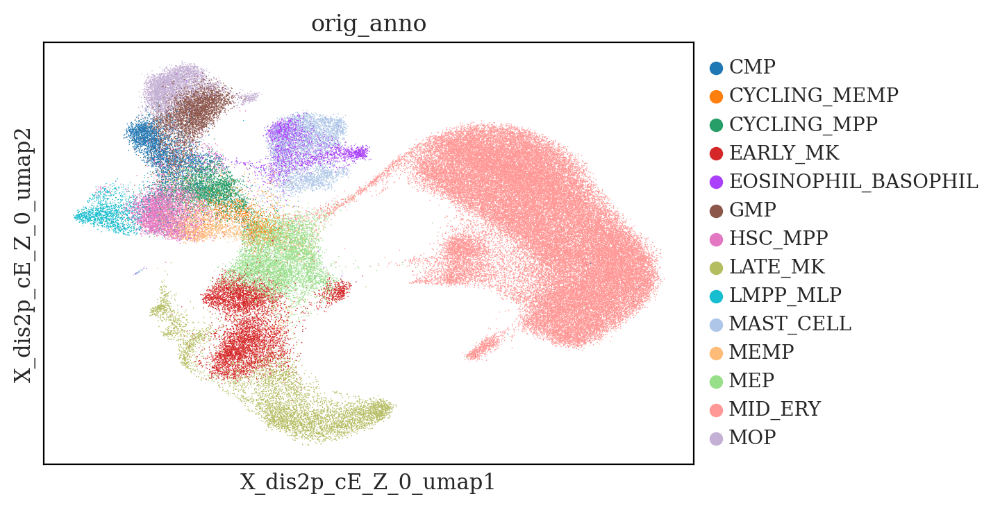

In [13]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.embedding(
    sub, 
    color='orig_anno',
    basis='X_dis2p_cE_Z_0_umap',
    title="orig_anno", 
    #legend_loc='on data',  
    legend_fontsize=10,    
    legend_fontoutline=2,
    ax=ax,
    show=False,
)

fig.savefig('suo_figs/z0_orig_anno_umap_sub.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/z0_orig_anno_umap_sub.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

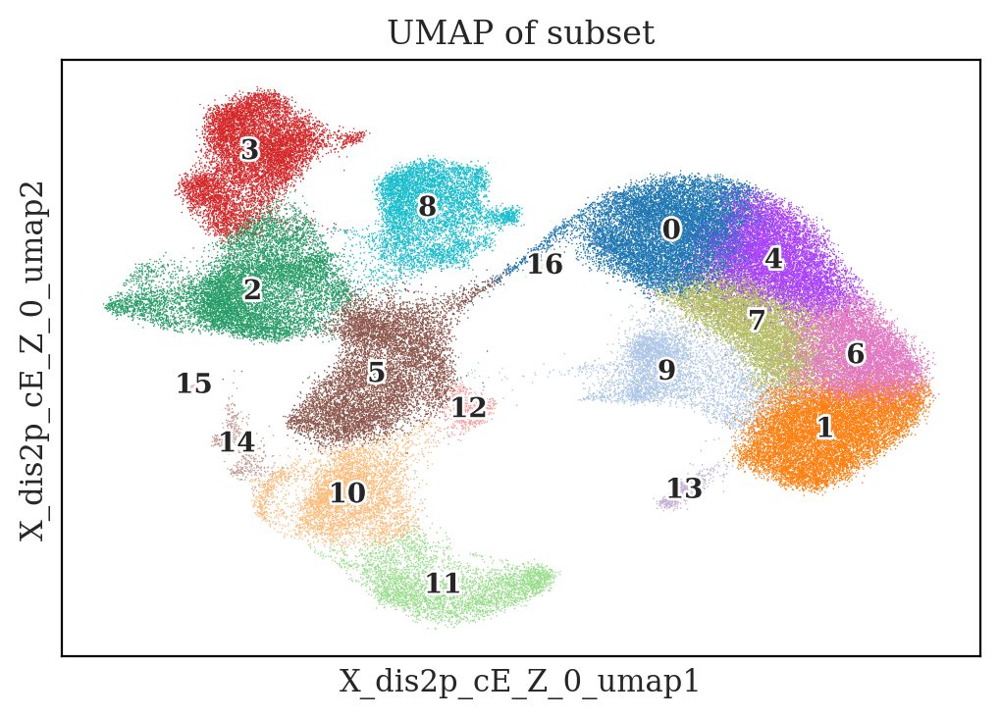

In [14]:
fig, ax = plt.subplots(nrows=1, ncols=1)

l = 'dis2p_cE_Z_0'

sc.tl.leiden(sub, resolution=1.0, neighbors_key=f'{l}_neighbors', key_added="leiden_clusters_sub_res1", random_state=0)
sc.pl.embedding(
    sub, 
    color='leiden_clusters_sub_res1',
    basis='X_dis2p_cE_Z_0_umap',
    title="UMAP of subset", 
    legend_loc='on data',  
    legend_fontsize=10,    
    legend_fontoutline=2,
    ax=ax,
    show=False,
)
fig.savefig('suo_figs/z0_cluster_umap_sub.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/z0_cluster_umap_sub.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [15]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

In [16]:
sub.write("scdisecct_on_immune_analysis.h5ad")


In [17]:
sub = sc.read("scdisecct_on_immune_analysis.h5ad")

In [18]:
l = 'dis2p_cE_Z_0'
sc.tl.paga(sub, neighbors_key=f'{l}_neighbors', groups="leiden_clusters_sub_res1")

In [19]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

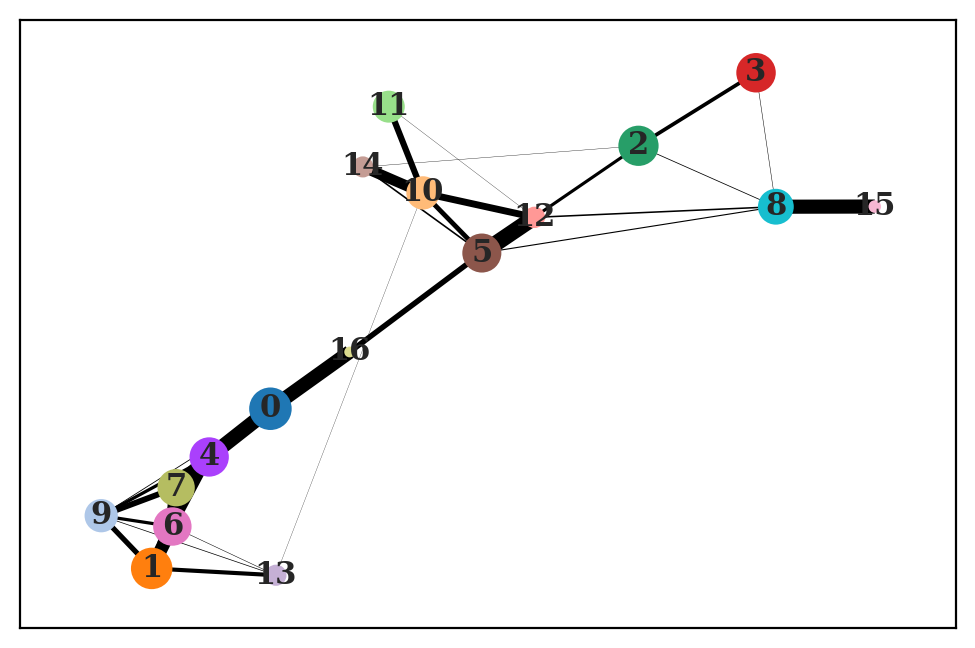

In [20]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.paga(sub, color="leiden_clusters_sub_res1", ax=ax, show=False)
fig.savefig('suo_figs/paga_sub.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/paga_sub.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [21]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

In [22]:
import time
start_time = time.time()
sc.tl.draw_graph(sub, neighbors_key=f'{l}_neighbors')
print("--- %s seconds ---" % (time.time() - start_time))

--- 1731.9901931285858 seconds ---


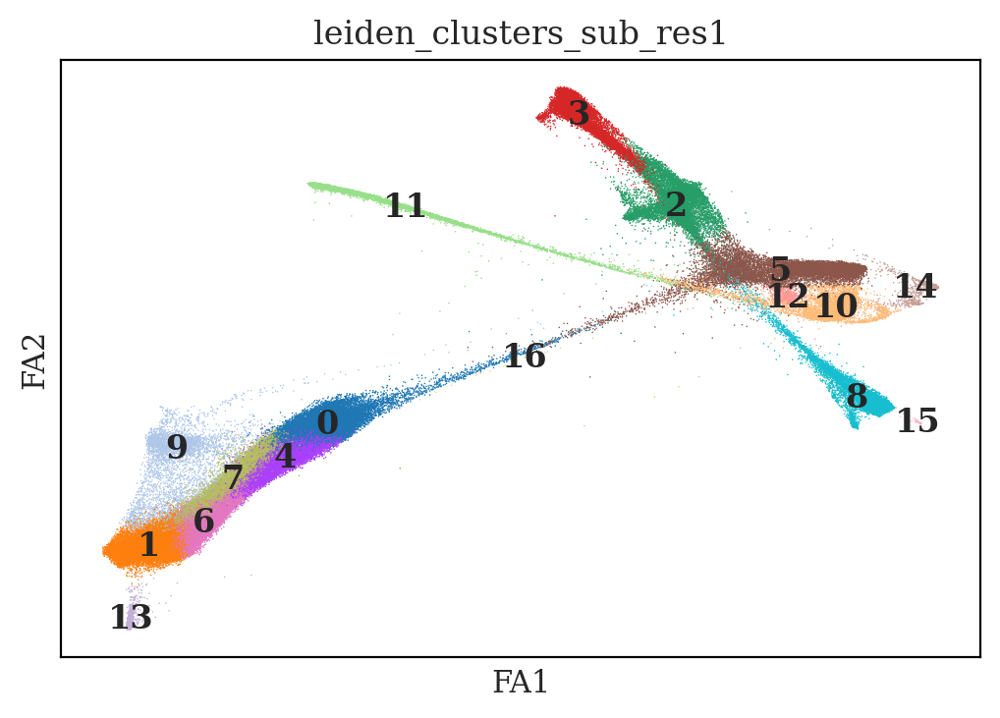

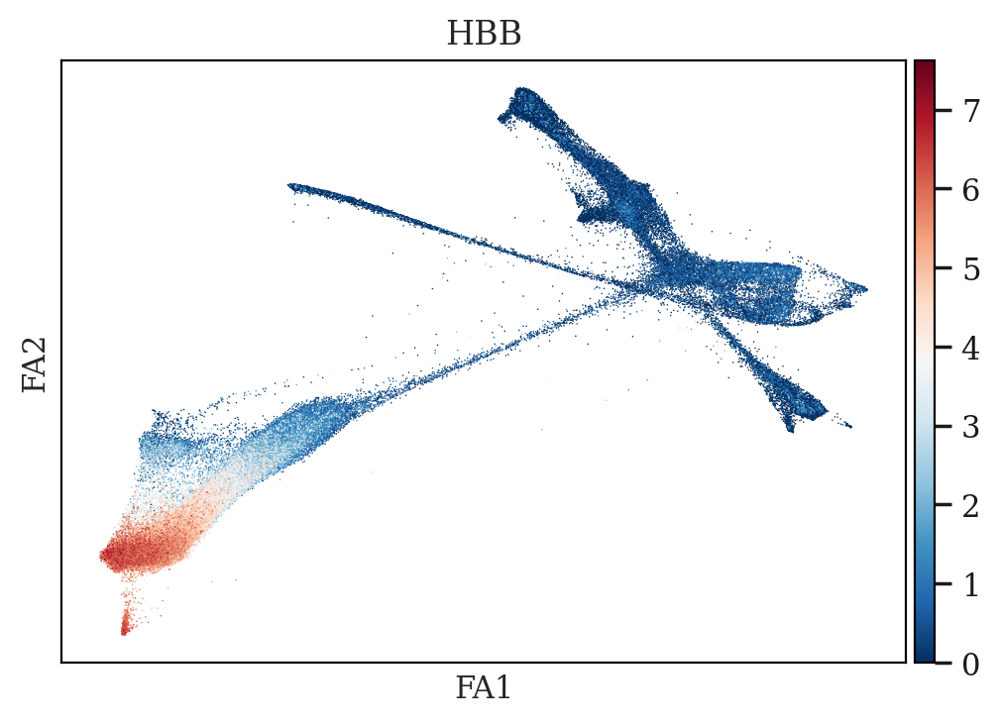

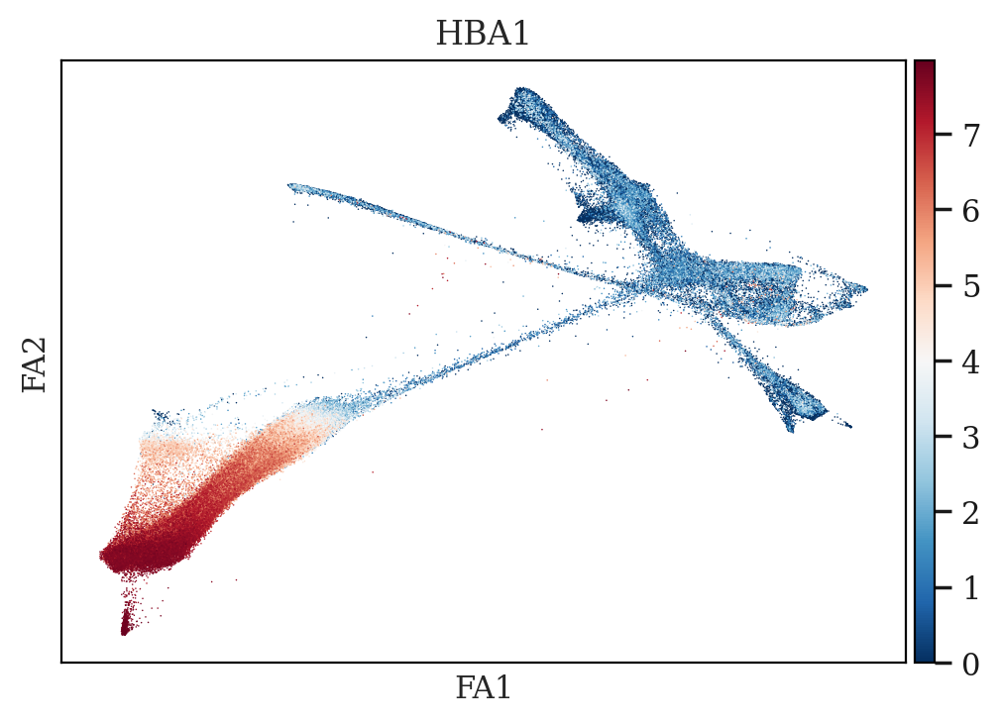

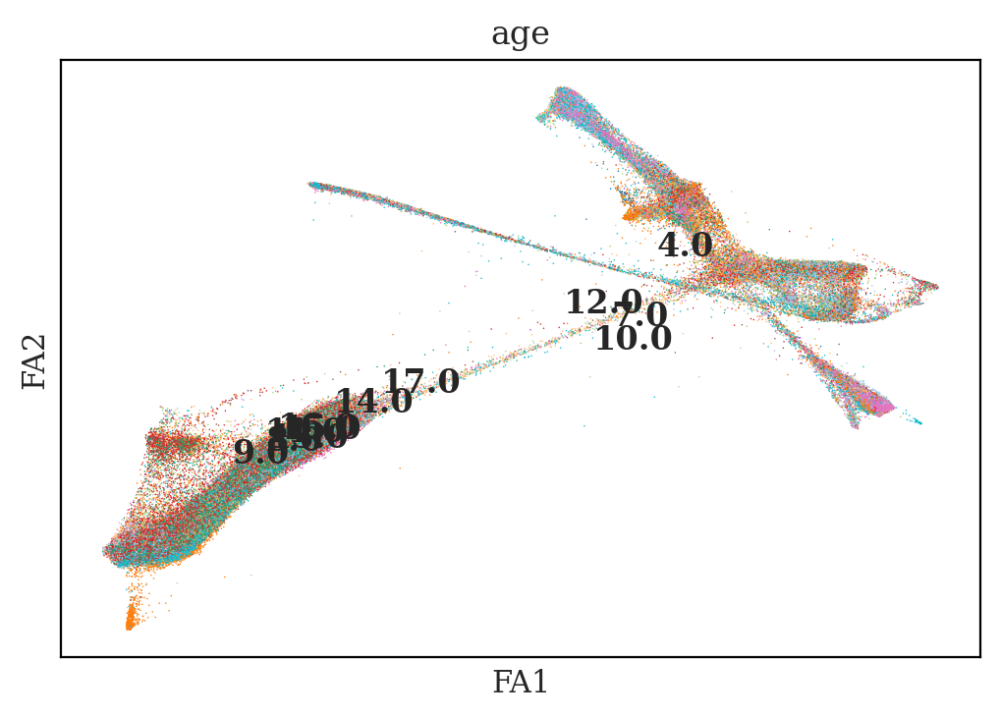

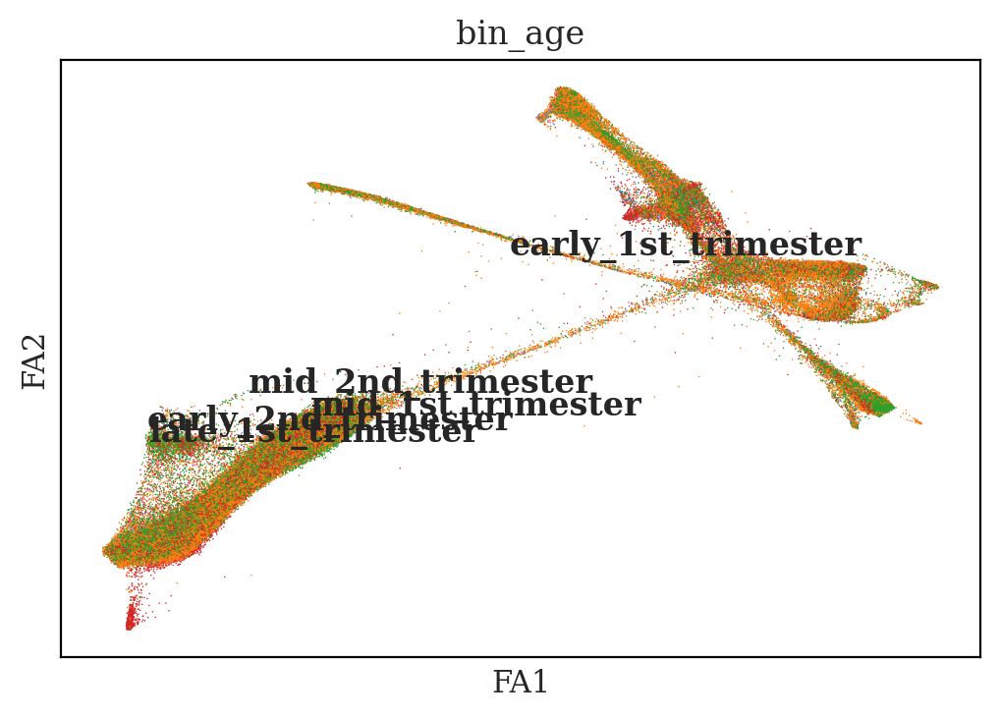

In [23]:
for col in ["leiden_clusters_sub_res1", "HBB","HBA1","age","bin_age"]:
    fig, ax = plt.subplots(nrows=1, ncols=1)

    sc.pl.draw_graph(
        sub, color=col, legend_loc="on data", ax=ax, show=False)
    fig.savefig(f'suo_figs/draw_graph_{col}.png', dpi=150, bbox_inches='tight')
    fig.savefig(f'suo_figs/draw_graph_{col}.png', dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)

In [24]:
sub.write("scdisecct_on_immune_analysis_paga.h5ad")

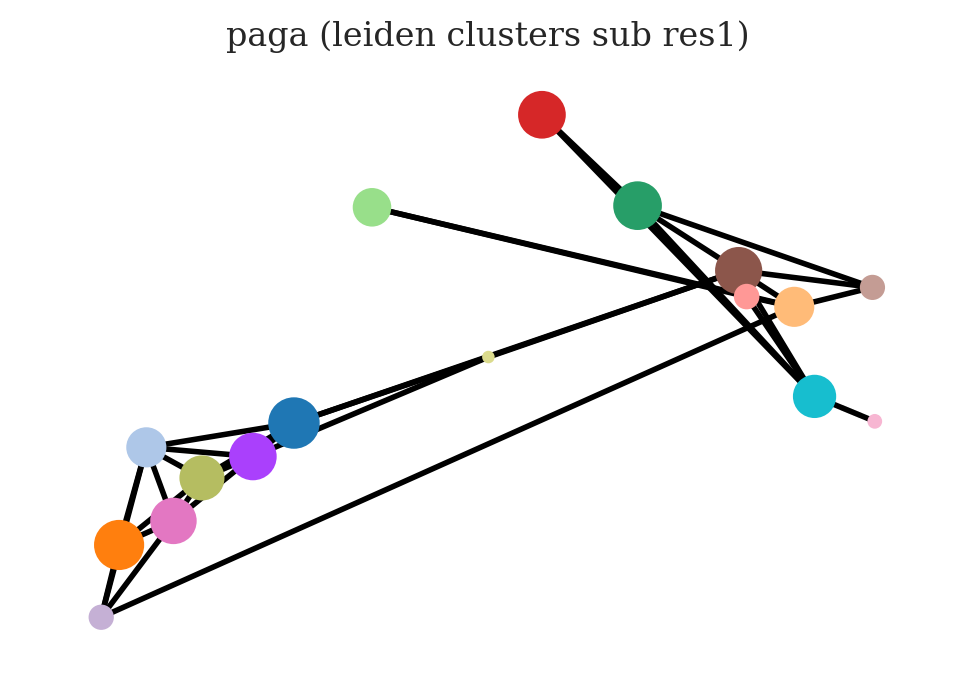

In [25]:
fig, ax = plt.subplots(nrows=1, ncols=1)

scv.pl.paga(sub, basis='draw_graph_fa', size=50, alpha=.1, min_edge_width=2, node_size_scale=1.5, ax=ax, show=False)
fig.savefig('suo_figs/draw_graph_fa.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/draw_graph_fa.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [26]:
sub.uns['iroot'] = np.flatnonzero(sub.obs['leiden_clusters_sub_res1'] == '2')[0]
sc.tl.diffmap(sub, neighbors_key=f'{l}_neighbors', n_comps=15)
sc.tl.dpt(sub, neighbors_key=f'{l}_neighbors')

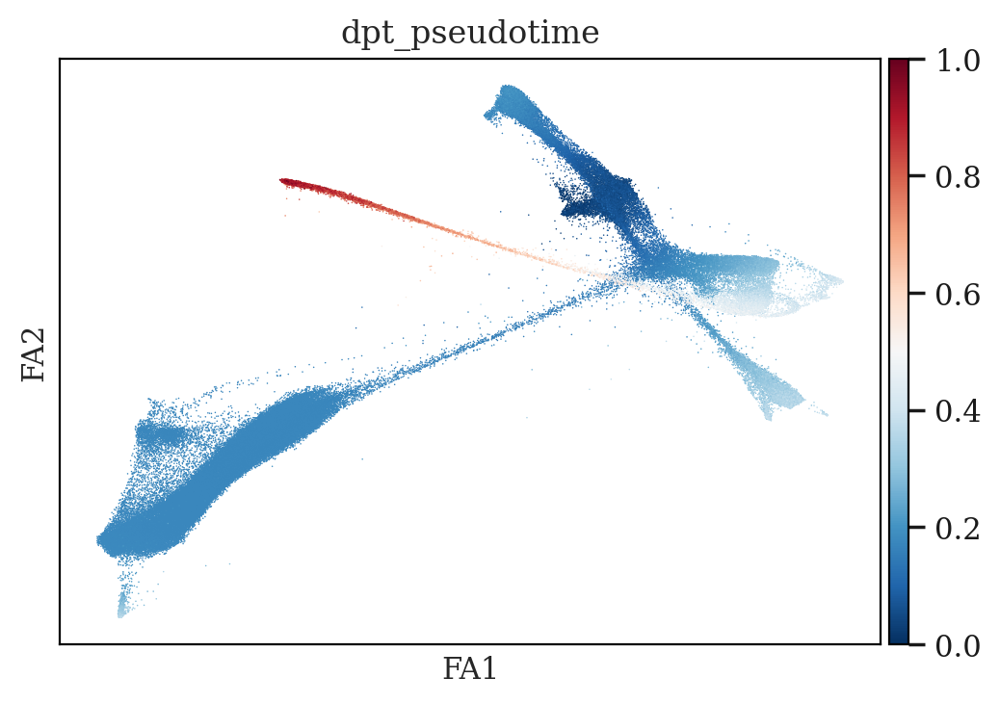

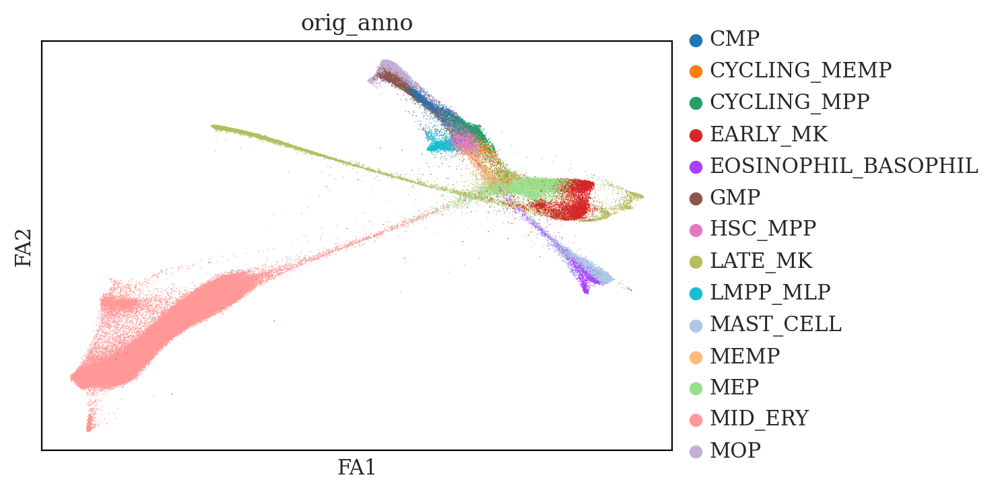

In [27]:
for col in ['dpt_pseudotime', 'orig_anno']:
    fig, ax = plt.subplots(nrows=1, ncols=1)

    sc.pl.draw_graph(sub, 
                     color=col,
                     ax=ax, 
                     show=False)
    fig.savefig(f'suo_figs/draw_graph_{col}.png', dpi=150, bbox_inches='tight')
    fig.savefig(f'suo_figs/draw_graph_{col}.png', dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)

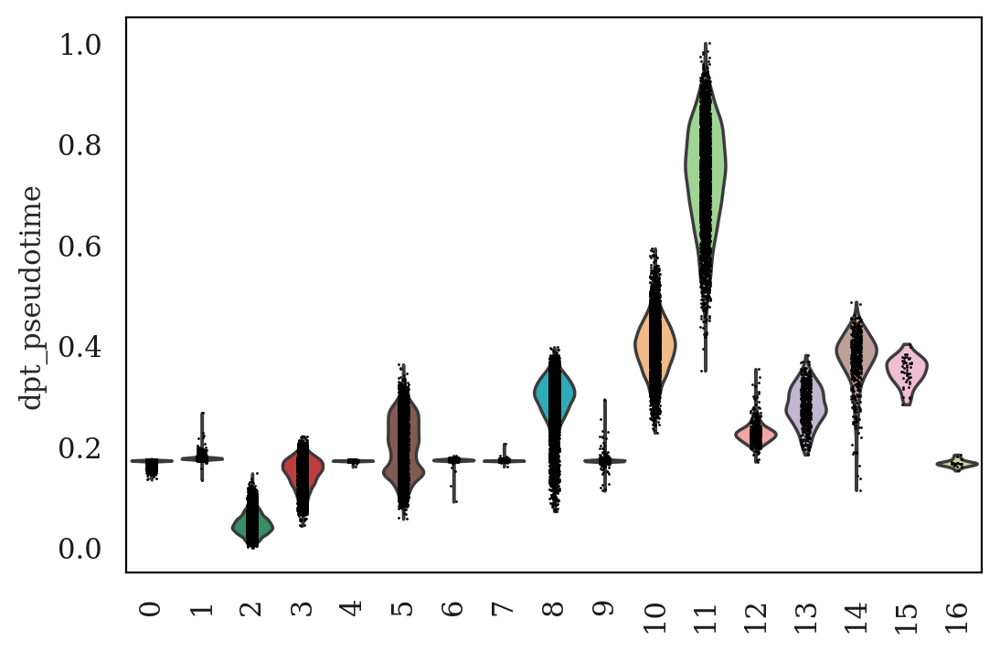

In [28]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.violin(sub, keys=["dpt_pseudotime"], groupby="leiden_clusters_sub_res1", rotation=90, ax=ax, show=False)
fig.savefig('suo_figs/violin_pseudotime_cluster.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/violin_pseudotime_cluster.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [29]:
sub.obs["new_anno"] = [str(i) for i in sub.obs["orig_anno"]]
sub.obs.loc[sub.obs["leiden_clusters_sub_res1"] == "12", "new_anno"] = "new_cell"

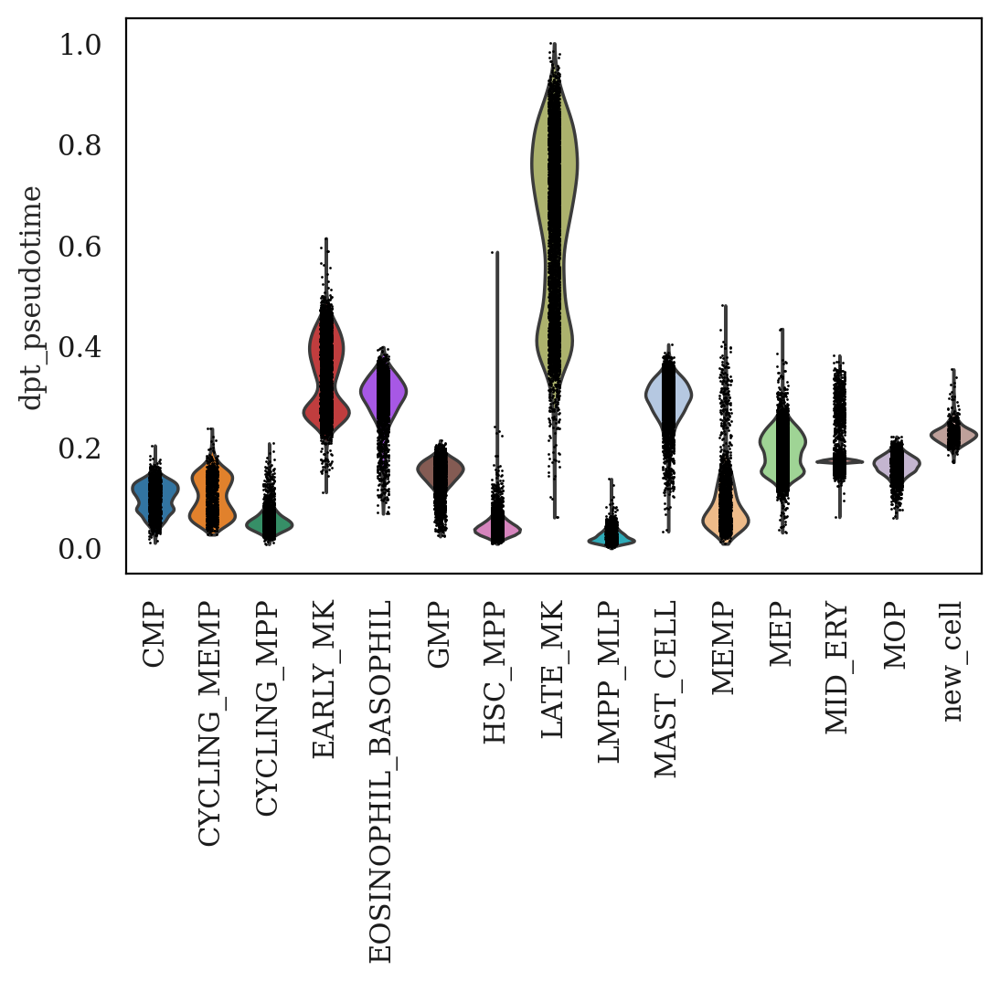

In [30]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.violin(sub, keys=["dpt_pseudotime"], groupby="new_anno", rotation=90, ax=ax, show=False)
fig.savefig('suo_figs/violin_pseudotime_newAnno.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/violin_pseudotime_newAnno.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

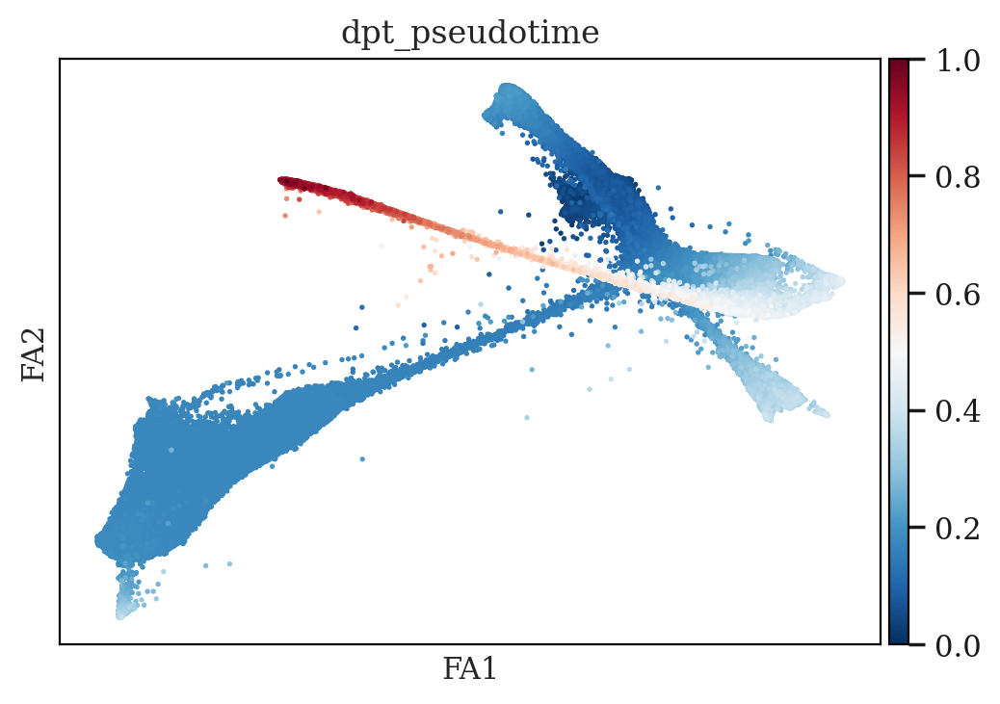

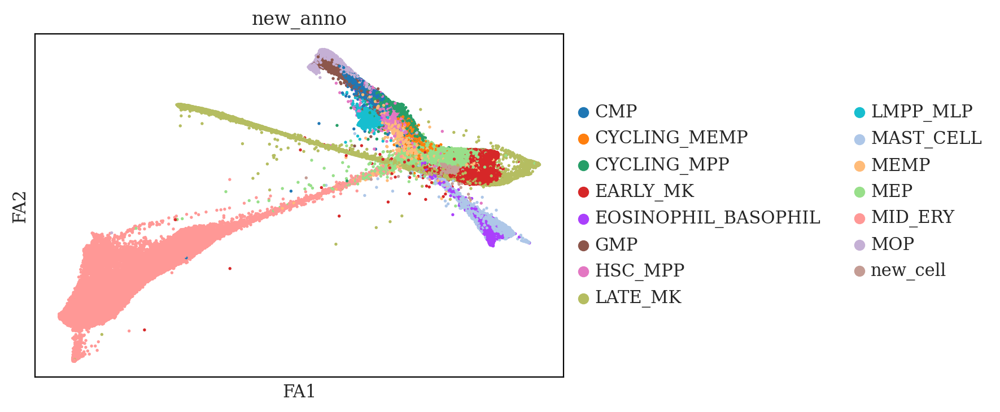

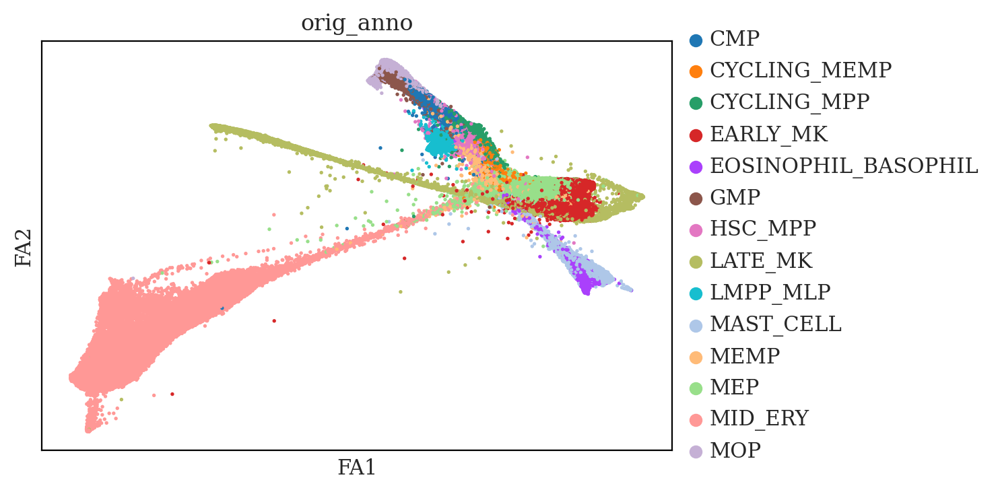

In [31]:
for col in ['dpt_pseudotime', 'new_anno', 'orig_anno']:
    fig, ax = plt.subplots(nrows=1, ncols=1)

    sc.pl.draw_graph(sub, 
                     color=col,
                     ncols=1,
                     size=15,
                     ax=ax, 
                     show=False)
    fig.savefig(f'suo_figs/draw_graph_{col}_size15.png', dpi=150, bbox_inches='tight')
    fig.savefig(f'suo_figs/draw_graph_{col}_size15.png', dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)

In [32]:
new_cell_names = sub[sub.obs['new_anno'] == 'new_cell'].obs.index
new_cell_names

Index(['FCAImmP7579224-GACGGCTCATGGTTGT', 'FCAImmP7803039-GCTGCTTGTTTGACAC',
       'FCAImmP7198630-TCTTCGGTCCAAGCCG', 'FCAImmP7528279-CATTCGCTCTGCCAGG',
       'FCAImmP7528279-CTGATAGTCACCTCGT', 'FCAImmP7528279-AAAGCAATCAGAGACG',
       'FCAImmP7528279-CTGAAACGTGGTCCGT', 'FCAImmP7528279-CGCGGTACATCGATTG',
       'FCAImmP7555857-ACTGAACAGTGCGTGA', 'FCAImmP7555857-AGTTGGTAGTAGCCGA',
       ...
       'FCAImmP7803020-GGGTCTGGTCAGATAA', 'FCAImmP7803020-CGTTCTGGTAACGTTC',
       'FCAImmP7803020-ACGGCCATCCAGTATG', 'FCAImmP7803020-TTTCCTCCAGATCTGT',
       'FCAImmP7803020-AAAGTAGAGCCCTAAT', 'FCAImmP7803020-TTAGGACAGGGTCGAT',
       'FCAImmP7803020-CGTGTAAAGTACCGGA', 'FCAImmP7803020-GACGGCTAGTCCGTAT',
       'FCAImmP7803020-TACTTGTGTACGACCC', 'FCAImmP7803020-ATGGGAGAGGGTGTTG'],
      dtype='object', length=622)

In [33]:
adata.obs['new_anno'] = adata.obs['orig_anno'].copy()
adata.obs['new_anno'] = adata.obs['new_anno'].astype(str)
adata.obs.loc[adata.obs.index.isin(new_cell_names), 'new_anno'] = 'new_cell'
adata.obs['new_anno'] = adata.obs['new_anno'].astype('category')

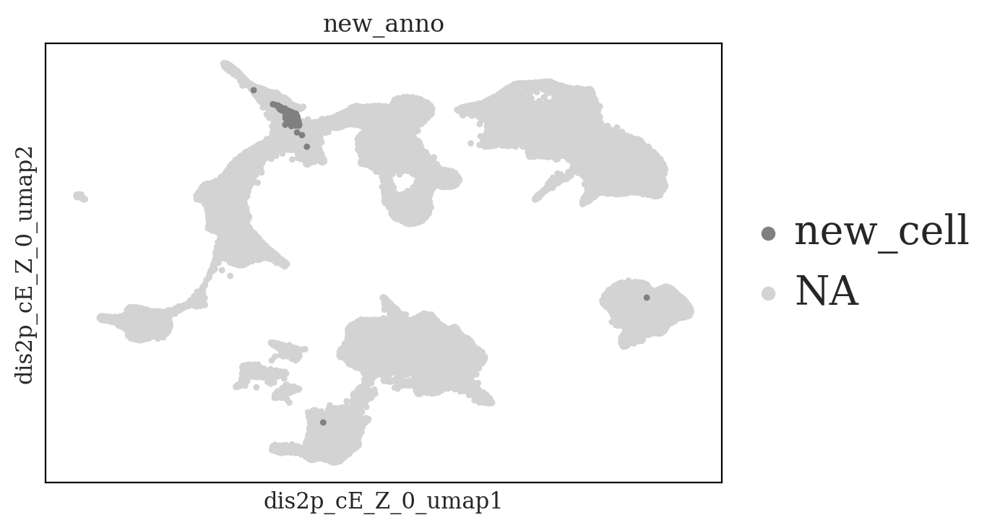

In [34]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.embedding(
    adata, 
    color=['new_anno'],
    groups=['new_cell',],
    basis='dis2p_cE_Z_0_umap',
    # title="organ", 
    #legend_loc='on data',  
    legend_fontsize=20,    
    legend_fontoutline=2,
    size=40,
    ax=ax,
    show=False,
)

fig.savefig('suo_figs/new_anno_new_cell_Z0_all.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/new_anno_new_cell_Z0_all.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [35]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

In [36]:
from cellrank.kernels import CytoTRACEKernel
ctk = CytoTRACEKernel(sub, conn_key="dis2p_cE_Z_0_neighbors_connectivities").compute_cytotrace(layer="counts")

Computing CytoTRACE score with `8192` genes. Consider using more than `10000` genes
Adding `adata.obs['ct_score']`
       `adata.obs['ct_pseudotime']`
       `adata.obs['ct_num_exp_genes']`
       `adata.var['ct_gene_corr']`
       `adata.var['ct_correlates']`
       `adata.uns['ct_params']`
    Finish (0:00:01)


In [37]:
ctk.compute_transition_matrix(threshold_scheme="soft", nu=0.5)

Computing transition matrix based on pseudotime


  0%|          | 0/99505 [00:00<?, ?cell/s]

    Finish (0:00:33)


CytoTRACEKernel[n=99505, dnorm=False, scheme='soft', b=10.0, nu=0.5]

Projecting transition matrix onto `dis2p_cE_Z_0_umap`
Adding `adata.obsm['T_fwd_dis2p_cE_Z_0_umap']`
    Finish (0:00:35)


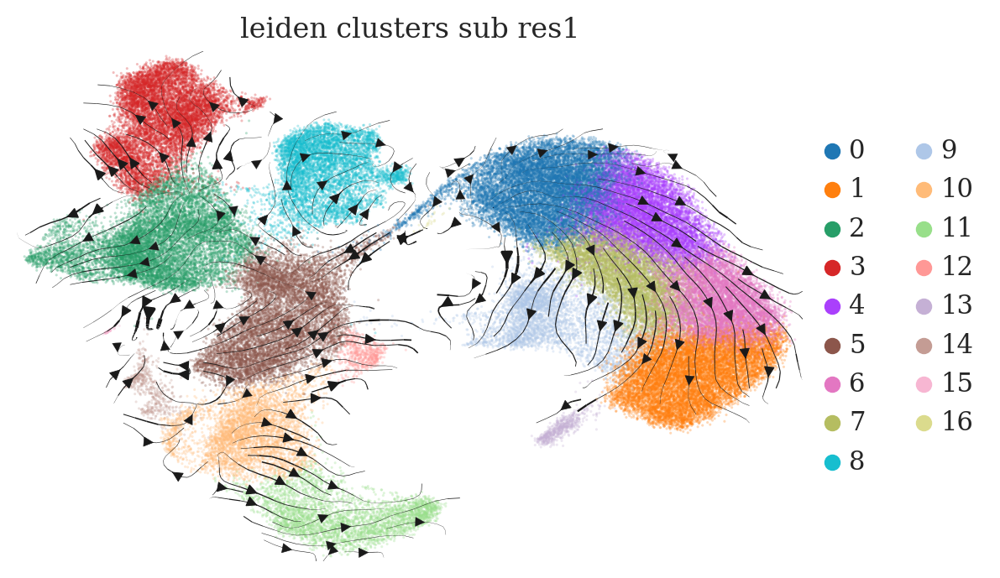

In [38]:
fig, ax = plt.subplots(nrows=1, ncols=1)

ctk.plot_projection(basis="X_dis2p_cE_Z_0_umap", color="leiden_clusters_sub_res1", legend_loc="right", size=5, ax=ax, show=False)
fig.savefig('suo_figs/cellrank_our_Z0_embedding_umap.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/cellrank_our_Z0_embedding_umap.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

Projecting transition matrix onto `draw_graph_fa`
Adding `adata.obsm['T_fwd_draw_graph_fa']`
    Finish (0:00:45)


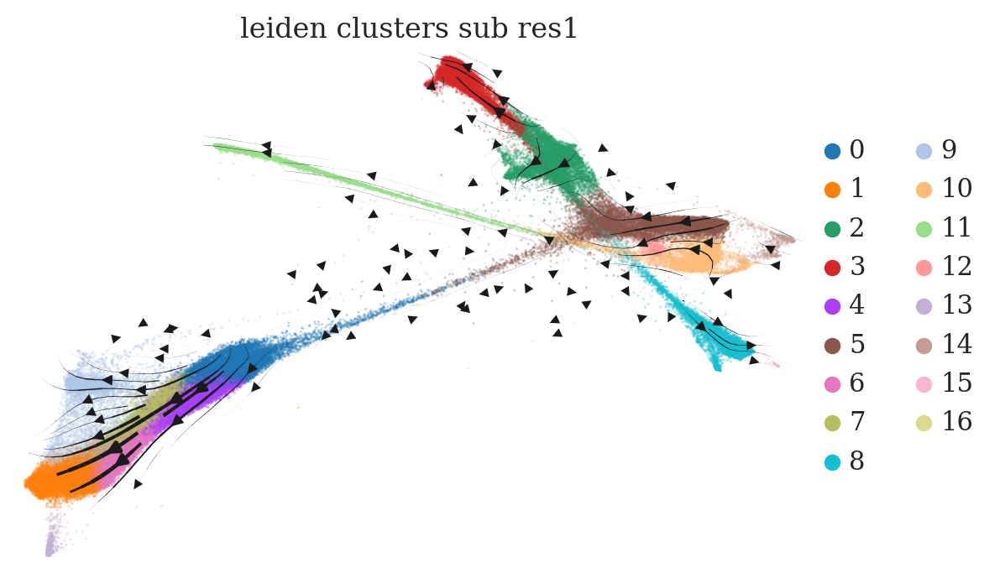

In [39]:
fig, ax = plt.subplots(nrows=1, ncols=1)

ctk.plot_projection(basis="draw_graph_fa", color="leiden_clusters_sub_res1", legend_loc="right", size=5, ax=ax, show=False)
fig.savefig('suo_figs/cellrank_paga.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/cellrank_paga.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [40]:
sub

AnnData object with n_obs × n_vars = 99505 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 'Chuan

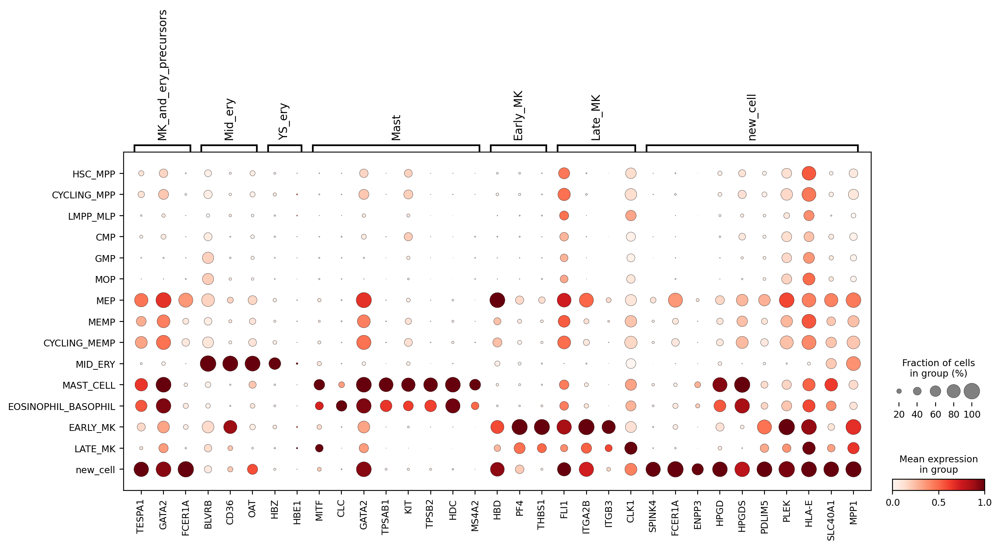

In [41]:
genes = {

'MK_and_ery_precursors' : [
'TESPA1',
'GATA2',
'FCER1A',
],

# 'Early_ery' : [
# 'KLF1',
# 'APOE',
# 'FAM178B', 
# 'GATA1'
# ],

'Mid_ery' : [
'BLVRB',
'CD36',
'OAT',
],

# 'Late_ery' : [
# 'GYPA',
# 'GYPB',
# 'SLC4A1',
# ],

'YS_ery' : [
'HBZ',
'HBE1',
],

    
'Mast' : [
    'MITF',
    'CLC',
    'GATA2',
    'TPSAB1',
    'KIT',
    'TPSB2',
    'HDC',
    'MS4A2'
],
    
    
'Early_MK' : [
'HBD',
'PF4',
'THBS1',
],

'Late_MK' : [
'FLI1',
'ITGA2B',
'ITGB3',
'CLK1',
],
 

'new_cell' : [
'SPINK4',
'FCER1A',
'ENPP3',
'HPGD',
'HPGDS',
'PDLIM5',
'PLEK',
'HLA-E',
'SLC40A1',
'MPP1',
],
}


cat_order = [
'HSC_MPP',
'CYCLING_MPP',
'LMPP_MLP',
'CMP',   
'GMP',
'MOP',    
'MEP',    
'MEMP',    
'CYCLING_MEMP',  
# 'EARLY_ERY',    
'MID_ERY',    
# 'LATE_ERY',    
'MAST_CELL',    
'EOSINOPHIL_BASOPHIL',
'EARLY_MK',
'LATE_MK',
'new_cell']


plt.rcdefaults()
fig, ax = plt.subplots(figsize=(13.8, 6.5))

sc.pl.dotplot(sub, var_names=genes, groupby='new_anno', standard_scale='var', categories_order=cat_order, ax=ax, show=False)
fig.savefig('suo_figs/gene_dotplot.png', dpi=300, bbox_inches='tight')
fig.savefig('suo_figs/gene_dotplot.svg', dpi=300, bbox_inches='tight')
plt.show()
plt.close(fig)

In [42]:
genes['new_cell']

['SPINK4',
 'FCER1A',
 'ENPP3',
 'HPGD',
 'HPGDS',
 'PDLIM5',
 'PLEK',
 'HLA-E',
 'SLC40A1',
 'MPP1']

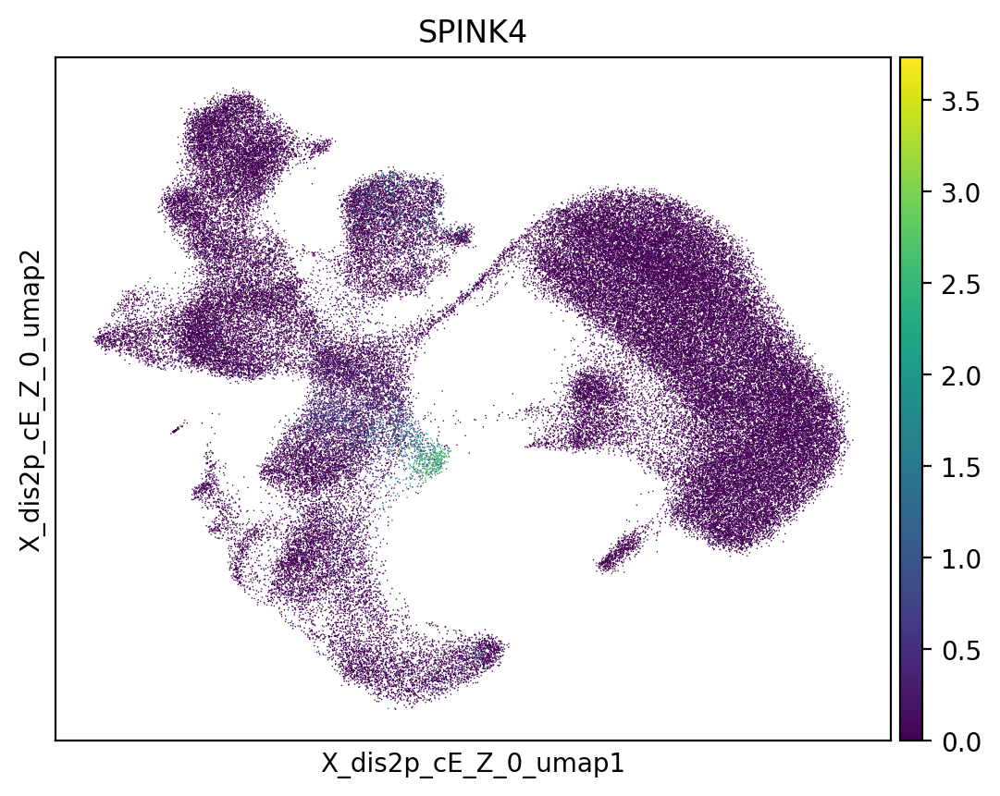

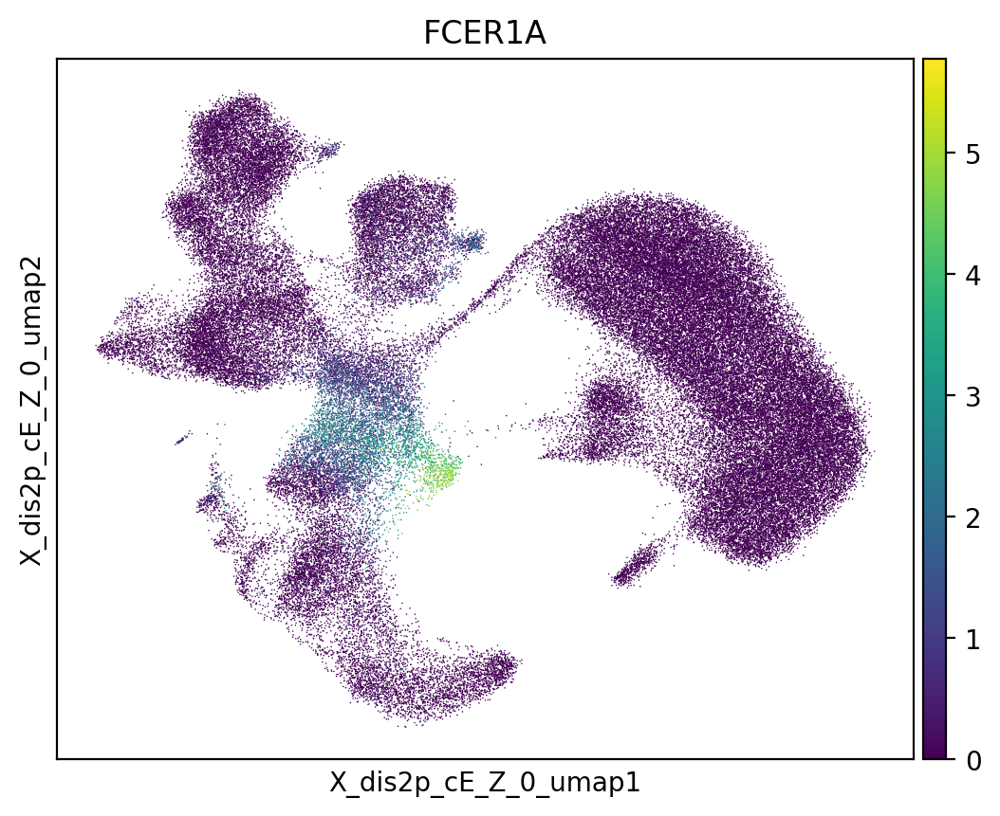

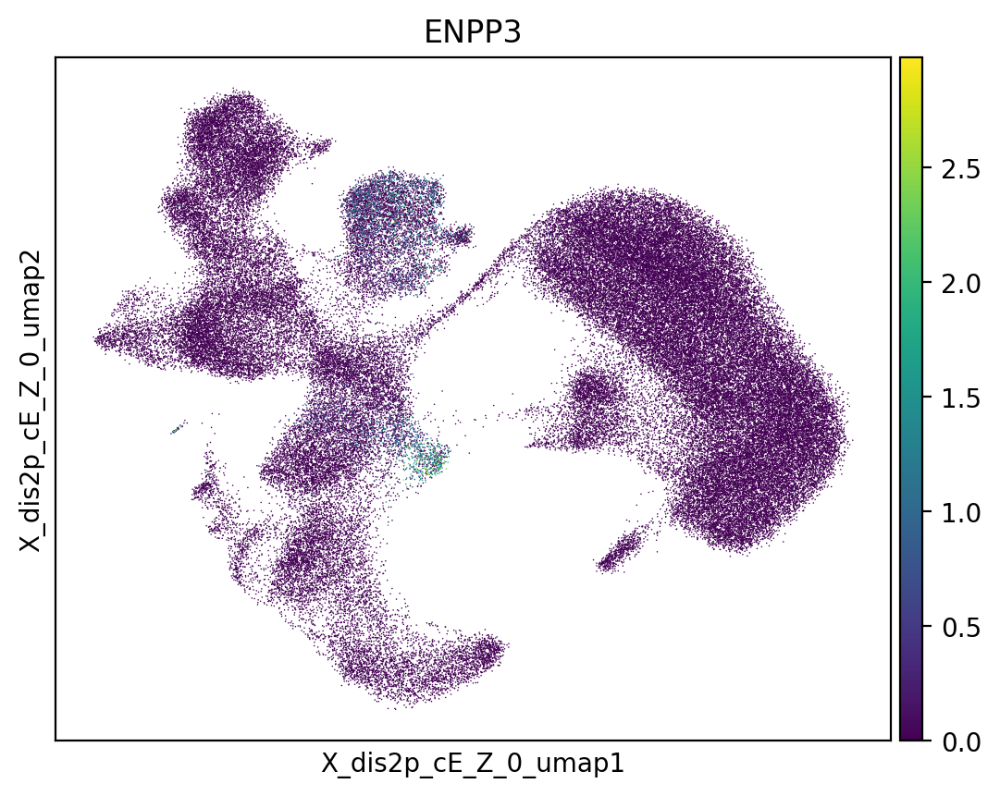

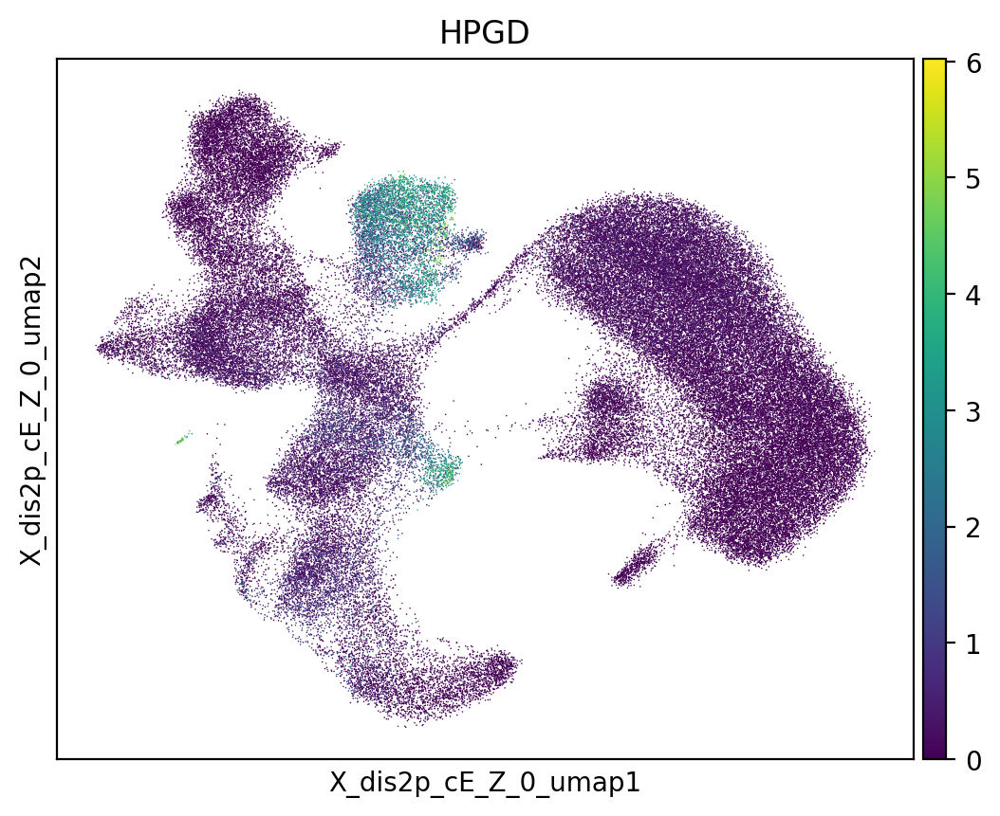

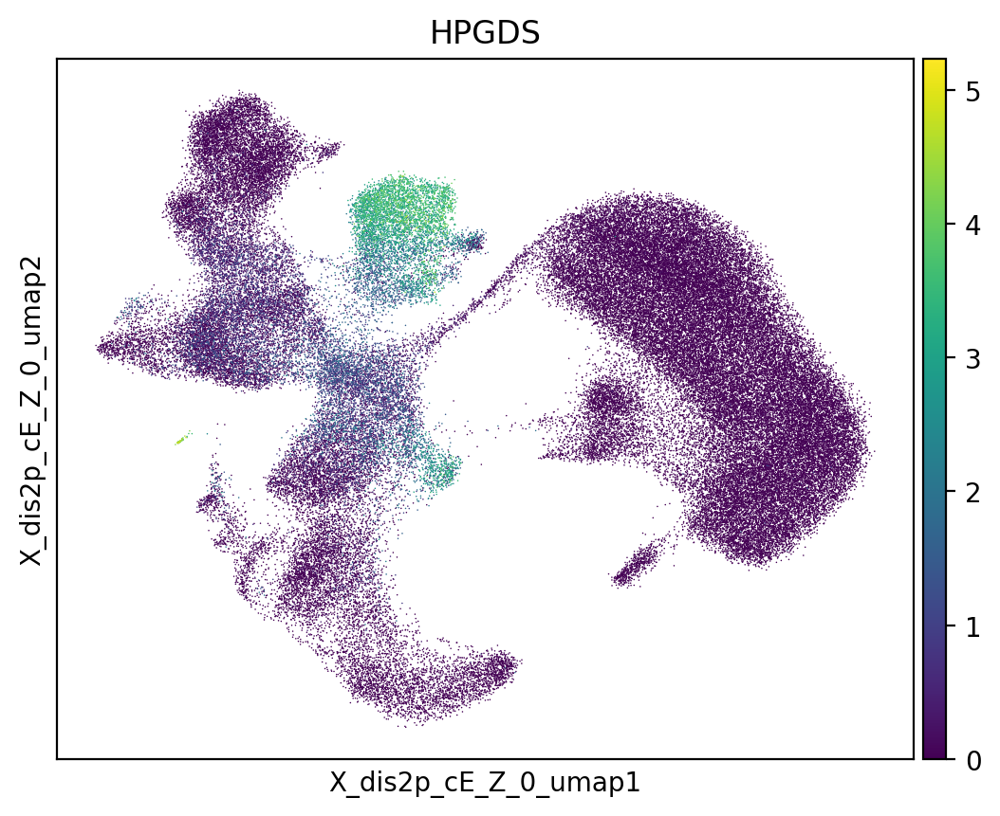

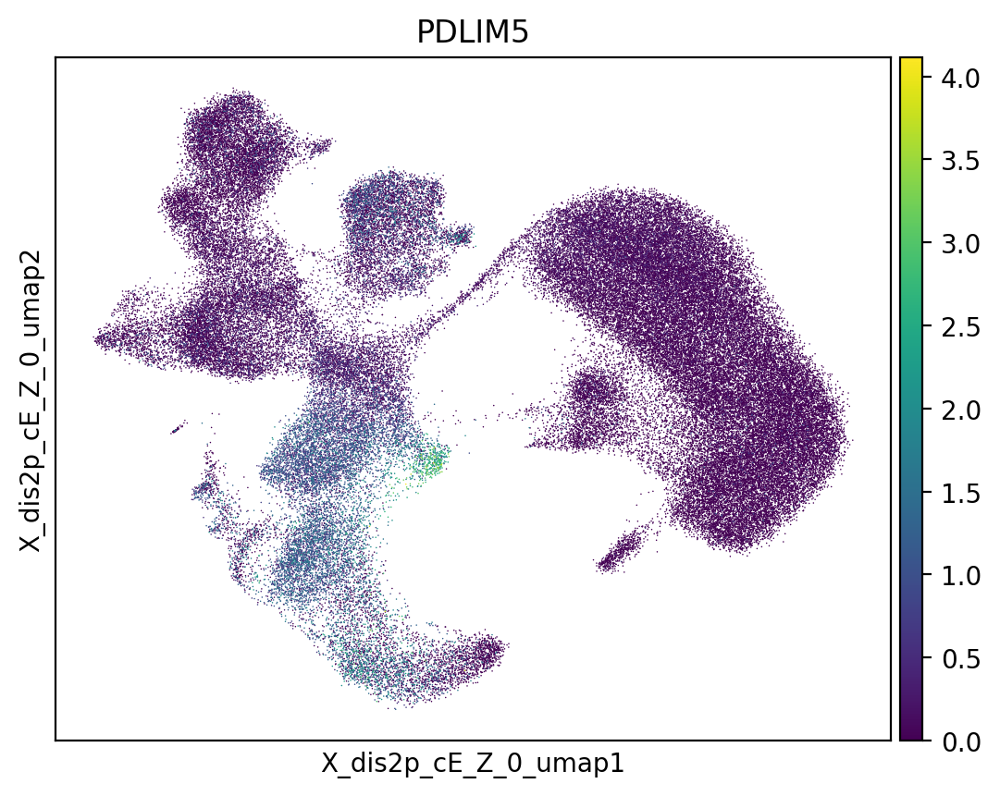

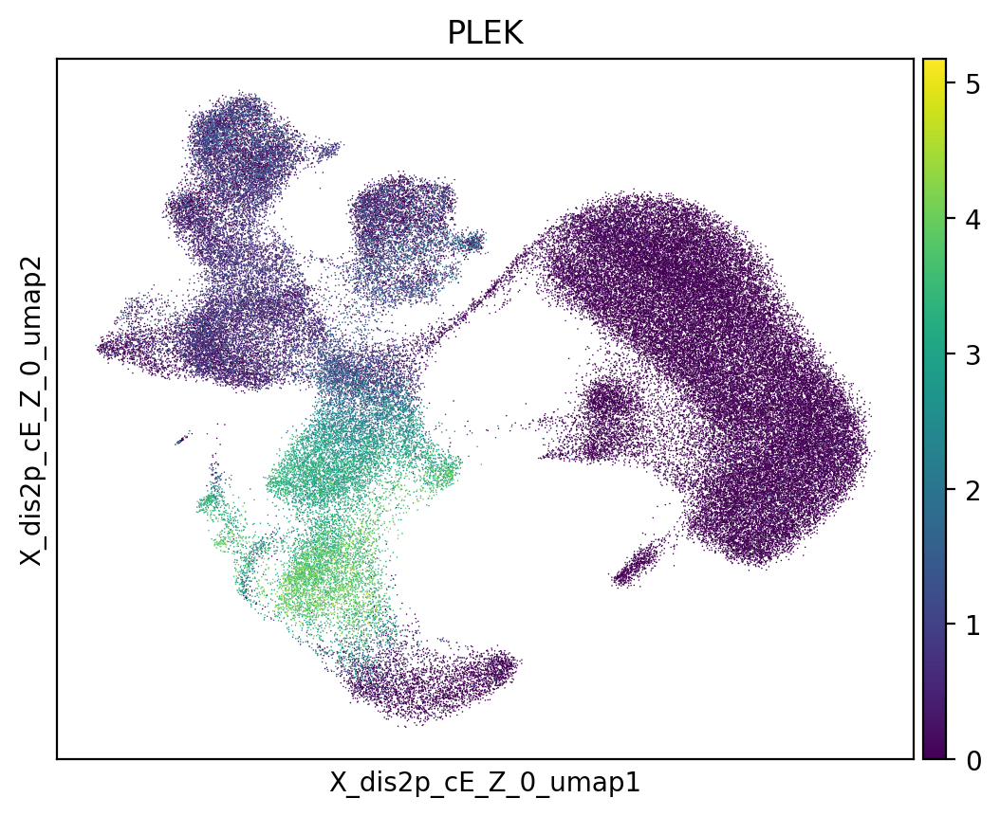

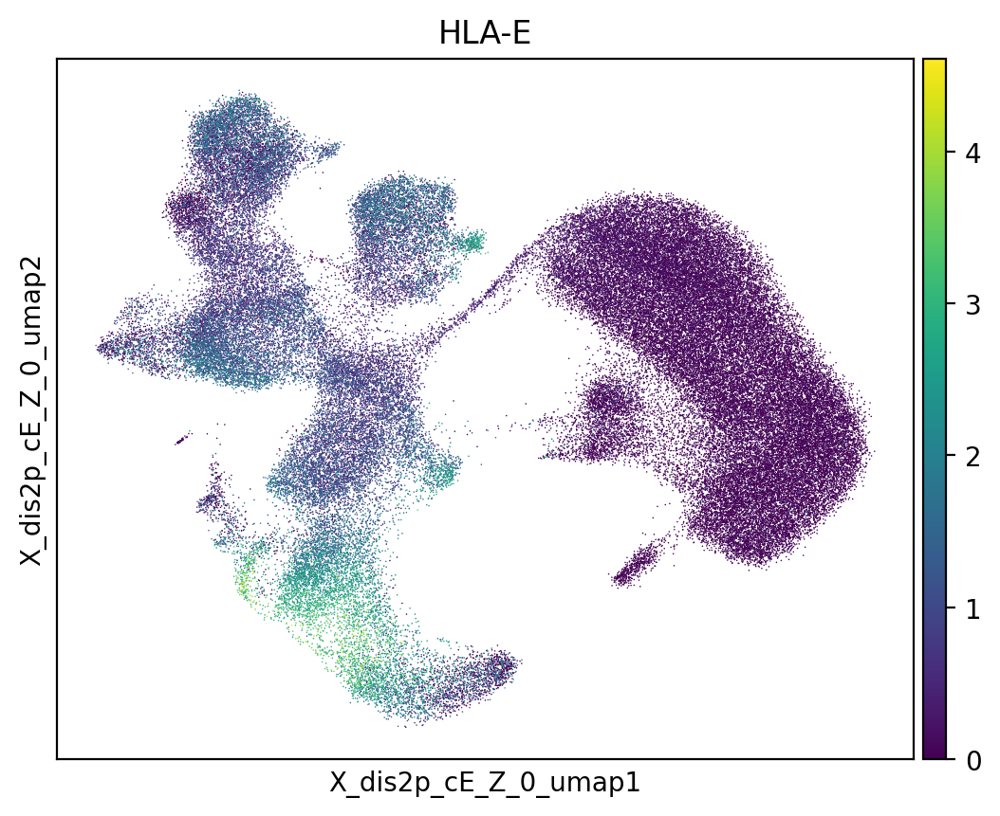

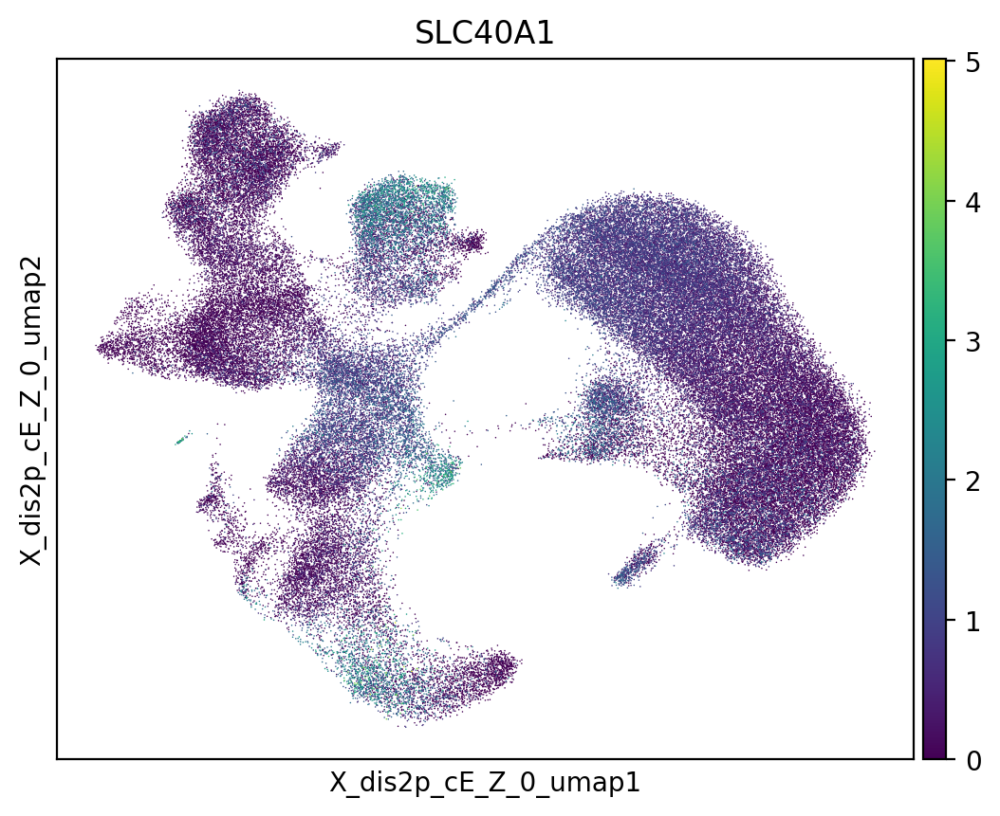

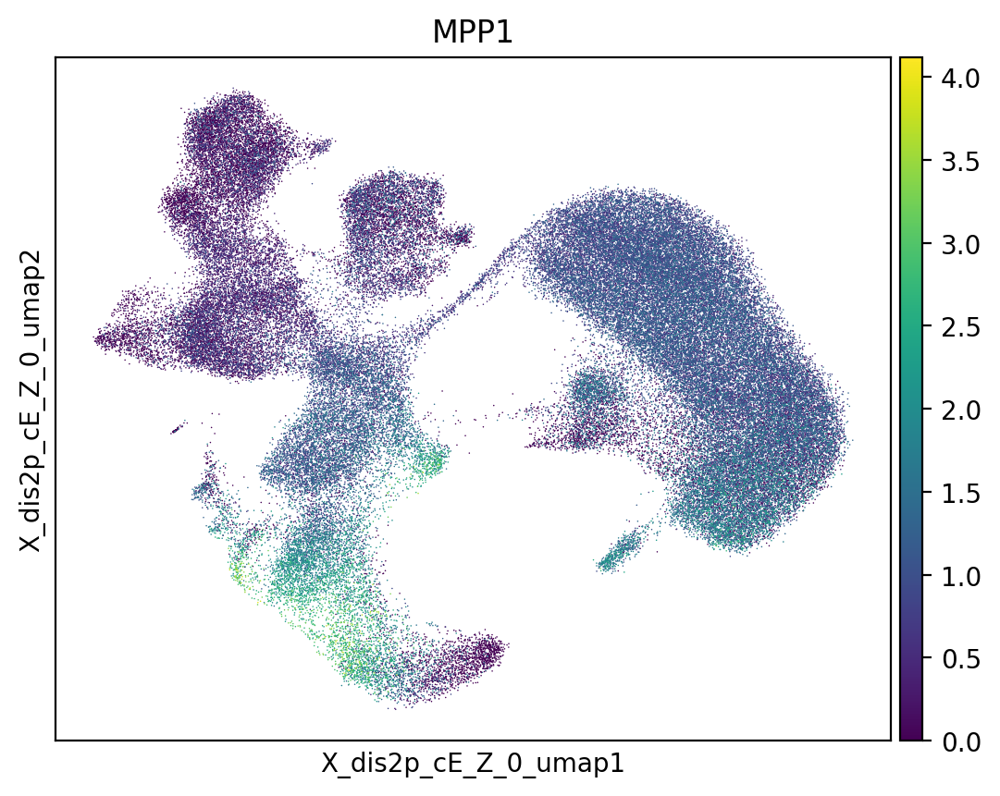

In [43]:
for gene in genes['new_cell']:
    fig, ax = plt.subplots(nrows=1, ncols=1)

    sc.pl.embedding(
        sub, 
        color=gene,
        basis='X_dis2p_cE_Z_0_umap',
        # title="", 
        #legend_loc='on data',  
        legend_fontsize=10,    
        legend_fontoutline=2,
        ax=ax,
        show=False,
    )

    fig.savefig(f'suo_figs/markerGene_umap_{gene}_z0_sub.png', dpi=150, bbox_inches='tight')
    fig.savefig(f'suo_figs/markerGene_umap_{gene}_z0_sub.svg', dpi=150, bbox_inches='tight')
    plt.show()
    plt.close(fig)

In [44]:
mt_genes = list(sub.var[sub.var.GeneName.str.startswith('MT-')].GeneName.values)
mt_genes

['MT-ND6',
 'MT-CO2',
 'MT-CYB',
 'MT-ND2',
 'MT-ND3',
 'MT-ND4',
 'MT-ATP6',
 'MT-CO3',
 'MT-ND4L',
 'MT-ATP8']

In [45]:
sub.X.max()

8.960568

In [46]:
sub.layers['counts'].max()

14562.0

In [47]:
sub.X.max()

8.960568

In [48]:
sub.X.max()

8.960568

In [49]:
sub.layers['normalized'] = sub.X.copy()
sub.X = sub.layers['counts'].copy()

# mitochondrial genes, "MT-" for human, "Mt-" for mouse
sub.var["mt"] = sub.var_names.str.startswith("MT-")

sc.pp.calculate_qc_metrics(
    sub, qc_vars=["mt"], inplace=True, log1p=True
)
sub.X = sub.layers['normalized'].copy()

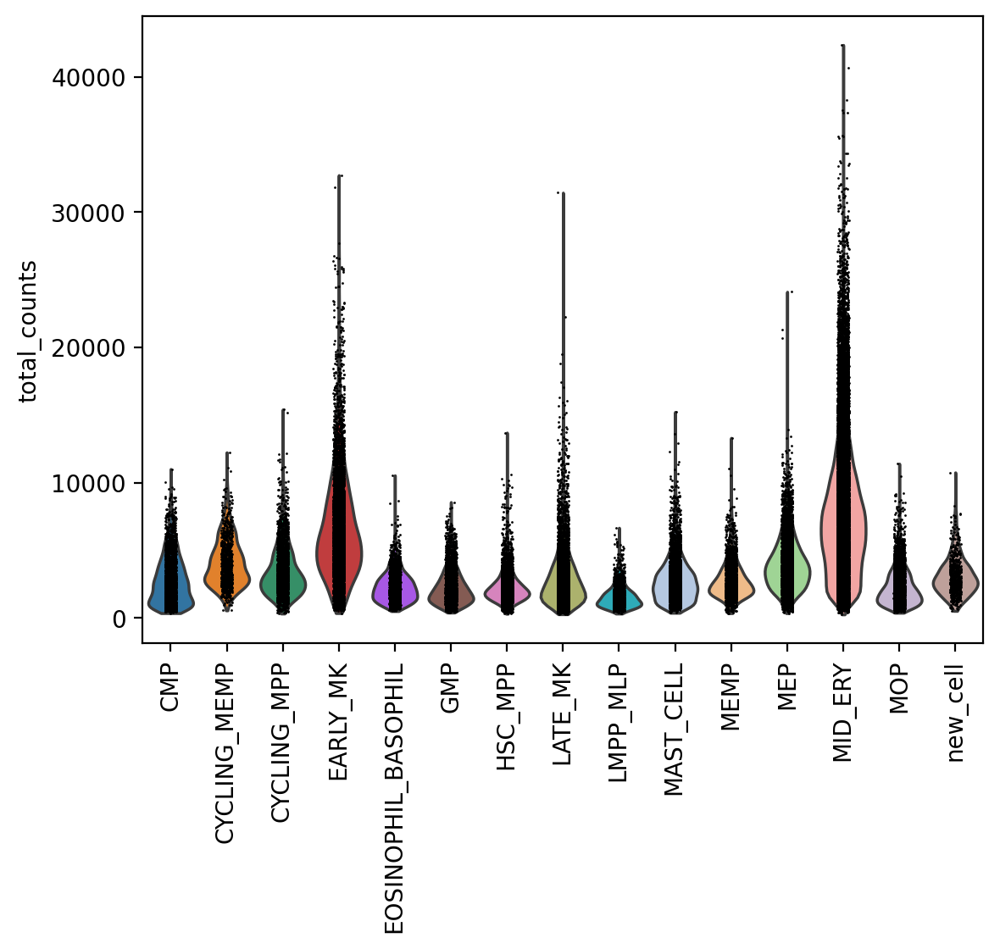

In [50]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.violin(
    sub,
    keys="total_counts",
    groupby='new_anno',
    rotation=90,
    ax=ax,
    show=False,
)
fig.savefig('suo_figs/total_counts_new_anno_sub.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/total_counts_new_anno_sub.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

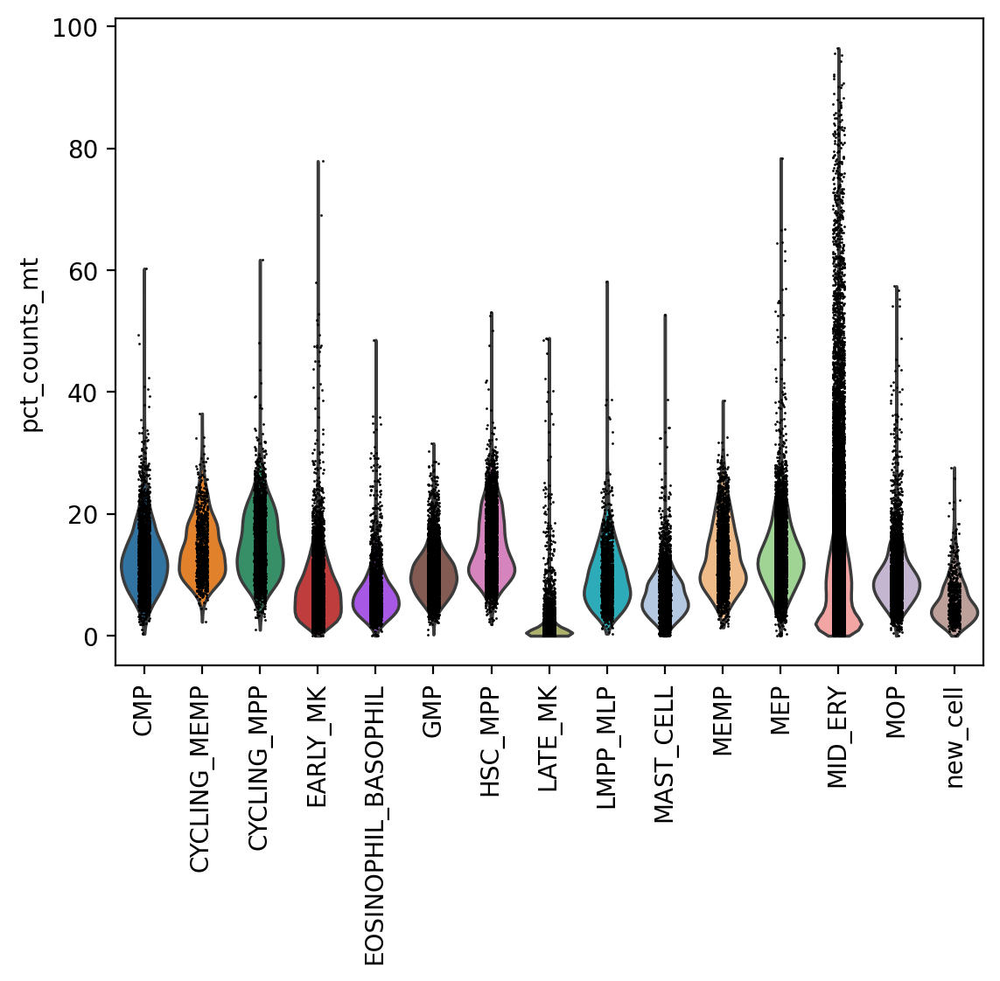

In [51]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.violin(
    sub,
    keys="pct_counts_mt",
    groupby='new_anno',
    rotation=90,
    ax=ax,
    show=False,
)
fig.savefig('suo_figs/mt_counts_pct_new_anno_sub.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/mt_counts_pct_new_anno_sub.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

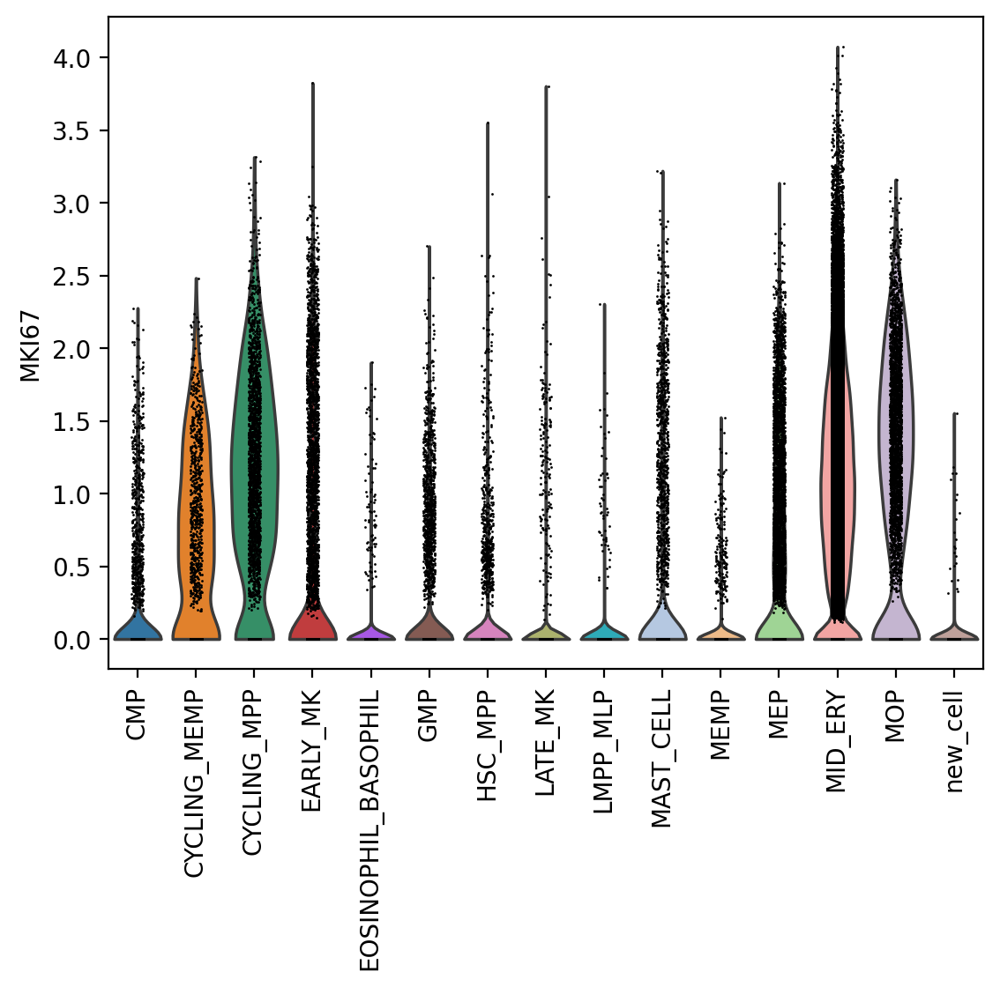

In [52]:
fig, ax = plt.subplots(nrows=1, ncols=1)

sc.pl.violin(
    sub,
    keys="MKI67",
    groupby='new_anno',
    rotation=90,
    ax=ax,
    show=False,
)
fig.savefig('suo_figs/MKI67_new_anno_sub.png', dpi=150, bbox_inches='tight')
fig.savefig('suo_figs/MKI67_new_anno_sub.svg', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig)

In [53]:
sub.write("scdisecct_on_immune_analysis_paga_graph.h5ad")

In [2]:
sub = sc.read_h5ad('scdisecct_on_immune_analysis_paga_graph.h5ad')

In [3]:
sub[sub.obs['new_anno'] == 'new_cell']

View of AnnData object with n_obs × n_vars = 622 × 8192
    obs: 'study', 'sample_ID', 'lane_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'sample_status', 'library_platform', 'strand_sequence', 'biological_unit', 'doi', 'institute', 'study_PI', 'subject_ID', 'ethnicity_1', 'ethnicity_2', 'disease_known', 'disease_condition', 'subject_type', 'sample_type', 'sample_cultured', 'anatomical_region', 'anatomical_region_level_2', 'protocol_tissue_dissociation', 'cell_enrichment', 'reference_genome', 'reference_genome_ensembl_release', 'reads_processing', 'sequencing_platform', 'Sample_orig_author', 'Anatomical_region_orig_author', 'Termination_method_orig_author', 'Method_orig_author', 'anno_lvl_2_final_clean_orig_author', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'author_batch', 'Chuan_meta_Original_Label', 'Chuan_meta_Harmonised_Label', 'Chuan_meta_Tissue', 'Chuan_meta_Technology', 'Chuan_meta_Donor', 

In [5]:
sub[sub.obs['new_anno'] == 'new_cell'].obs['organ'].value_counts()

organ
Spleen          269
Liver           169
Bone_marrow     121
Skin             49
Yolk_sac          9
Kidney            3
Thymus            2
Name: count, dtype: int64